In [ ]:
# Importar las librerias

# Ejercicio 1
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
# Ejercicio 2
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay, balanced_accuracy_score,classification_report
from sklearn.metrics import roc_curve
from imblearn.over_sampling import SMOTE
# Ejercicio 3
from sklearn.dummy import DummyClassifier
# Ejercicio 4
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
import optuna
from sklearn.model_selection import cross_val_score
# Ejercicio 5
import shap
# Ejercicio 6
from pycaret.classification import setup, compare_models
# Ejercicio 7
from keras.models import Sequential
from keras.layers import Dense
from skopt import gp_minimize
from skopt.space import Real, Categorical, Integer
# Ejercicio 9
import joblib

from sklearn.cluster import KMeans
import contextily as ctx
from sklearn.cluster import DBSCAN
import warnings



# EJERCICIO 1

1. Se solicita en primera instancia crear clusters con las ciudades del Dataset para catalogarlas en otra categoría: regiones. La cantidad de regiones será definida por cada grupo, observarlas en un gráfico de latitud y longitud para acompañar la decisión.

In [101]:
# Cargar el dataset
df_ciudades = pd.read_csv('weatherAUS.csv')

# Mostramos todas las columnas que tiene nuestro dataset
print("Columnas dataset", "(Cantidad:" , len(df_ciudades.columns), "):", df_ciudades.columns)

Columnas dataset (Cantidad: 23 ): Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')


In [102]:
# Mostramos todas las ciudades que tenemos en el dataset
ciudades = df_ciudades['Location'].unique()
print(f"Número de ciudades únicas: {len(ciudades)}")
print(f"Ciudades: {ciudades}")

Número de ciudades únicas: 49
Ciudades: ['Albury' 'BadgerysCreek' 'Cobar' 'CoffsHarbour' 'Moree' 'Newcastle'
 'NorahHead' 'NorfolkIsland' 'Penrith' 'Richmond' 'Sydney' 'SydneyAirport'
 'WaggaWagga' 'Williamtown' 'Wollongong' 'Canberra' 'Tuggeranong'
 'MountGinini' 'Ballarat' 'Bendigo' 'Sale' 'MelbourneAirport' 'Melbourne'
 'Mildura' 'Nhil' 'Portland' 'Watsonia' 'Dartmoor' 'Brisbane' 'Cairns'
 'GoldCoast' 'Townsville' 'Adelaide' 'MountGambier' 'Nuriootpa' 'Woomera'
 'Albany' 'Witchcliffe' 'PearceRAAF' 'PerthAirport' 'Perth' 'SalmonGums'
 'Walpole' 'Hobart' 'Launceston' 'AliceSprings' 'Darwin' 'Katherine'
 'Uluru']


In [103]:
# 3. Diccionario de coordenadas para ciudades australianas (latitud, longitud)
coordenadas = {
    'Albury': (-36.0737, 146.9135),
    'BadgerysCreek': (-33.8680, 150.7650),
    'Cobar': (-31.4950, 145.8390),
    'CoffsHarbour': (-30.2963, 153.1179),
    'Moree': (-29.4650, 149.8344),
    'Newcastle': (-32.9283, 151.7817),
    'NorahHead': (-33.2809, 151.5773),
    'NorfolkIsland': (-29.0408, 167.9547),
    'Penrith': (-33.7511, 150.6942),
    'Richmond': (-33.5983, 150.7511),
    'Sydney': (-33.8688, 151.2093),
    'SydneyAirport': (-33.9399, 151.1753),
    'WaggaWagga': (-35.1082, 147.3598),
    'Williamtown': (-32.8136, 151.8367),
    'Wollongong': (-34.4278, 150.8931),
    'Canberra': (-35.2809, 149.1300),
    'Tuggeranong': (-35.4244, 149.0888),
    'MountGinini': (-35.5329, 148.7822),
    'Ballarat': (-37.5622, 143.8503),
    'Bendigo': (-36.7570, 144.2794),
    'Sale': (-38.1026, 147.0678),
    'MelbourneAirport': (-37.6690, 144.8410),
    'Melbourne': (-37.8136, 144.9631),
    'Mildura': (-34.2080, 142.1246),
    'Nhil': (-36.3331, 141.6503),
    'Portland': (-38.3432, 141.6036),
    'Watsonia': (-37.7071, 145.0830),
    'Dartmoor': (-37.9144, 141.2692),
    'Brisbane': (-27.4698, 153.0251),
    'Cairns': (-16.9186, 145.7781),
    'GoldCoast': (-28.0167, 153.4000),
    'Townsville': (-19.2590, 146.8169),
    'Adelaide': (-34.9285, 138.6007),
    'MountGambier': (-37.8316, 140.7830),
    'Nuriootpa': (-34.4703, 138.9976),
    'Woomera': (-31.1950, 136.8050),
    'Albany': (-35.0274, 117.8839),
    'Witchcliffe': (-34.0278, 115.1044),
    'PearceRAAF': (-31.6677, 115.9984),
    'PerthAirport': (-31.9385, 115.9673),
    'Perth': (-31.9505, 115.8605),
    'SalmonGums': (-32.9827, 121.6293),
    'Walpole': (-34.9535, 116.7075),
    'Hobart': (-42.8821, 147.3272),
    'Launceston': (-41.4332, 147.1455),
    'AliceSprings': (-23.6980, 133.8807),
    'Darwin': (-12.4634, 130.8456),
    'Katherine': (-14.4647, 132.2660),
    'Uluru': (-25.3444, 131.0369)
}
coords_df = pd.DataFrame(
    [(ciudad, lat, lon) for ciudad, (lat, lon) in coordenadas.items()],
    columns=['Ciudad', 'Latitud', 'Longitud']
)

In [104]:
def metodo_codo(data, max_k=10):
    inertias = []
    for k in range(1, max_k+1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        inertias.append(kmeans.inertia_)

    plt.figure(figsize=(10, 6))
    plt.plot(range(1, max_k+1), inertias, 'bo-')
    plt.xlabel('Número de clusters (k)')
    plt.ylabel('Inercia')
    plt.title('Método del codo para determinar k óptimo')
    plt.grid(True)
    plt.show()
    return inertias

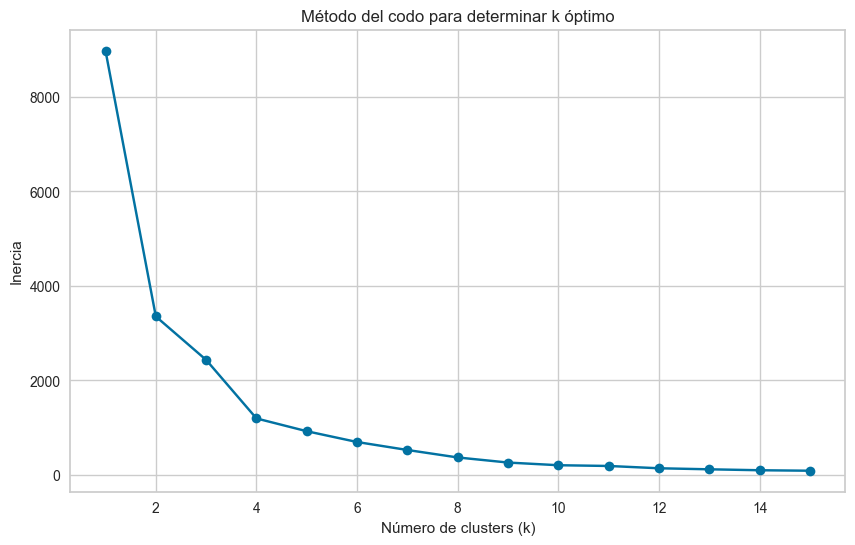

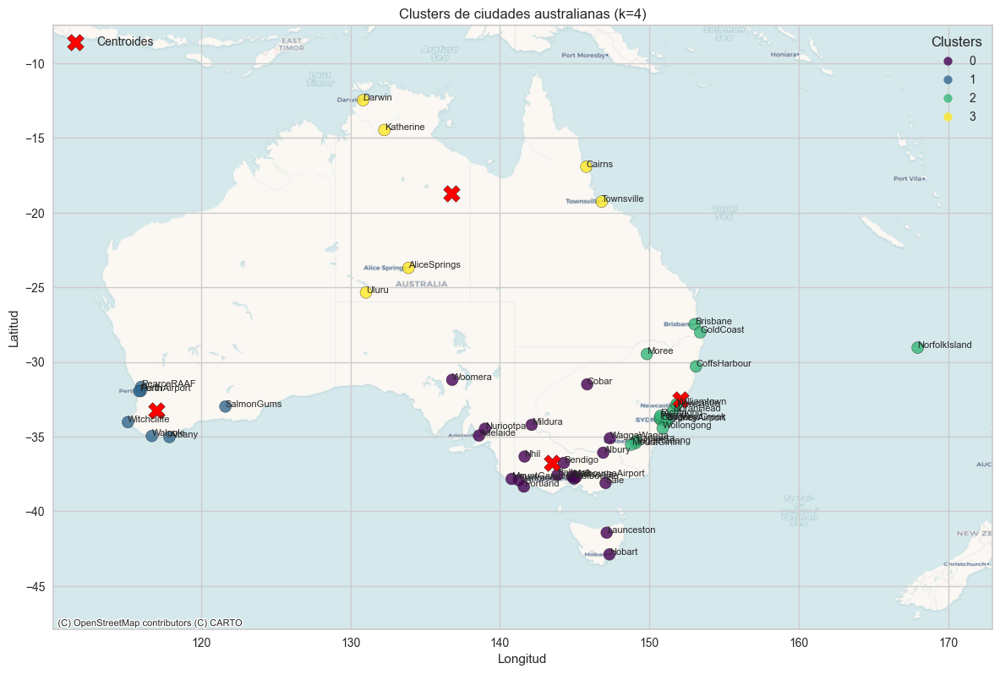


Ciudades en cada cluster:
Cluster 0: Albury, Cobar, WaggaWagga, Ballarat, Bendigo, Sale, MelbourneAirport, Melbourne, Mildura, Nhil, Portland, Watsonia, Dartmoor, Adelaide, MountGambier, Nuriootpa, Woomera, Hobart, Launceston
Cluster 1: Albany, Witchcliffe, PearceRAAF, PerthAirport, Perth, SalmonGums, Walpole
Cluster 2: BadgerysCreek, CoffsHarbour, Moree, Newcastle, NorahHead, NorfolkIsland, Penrith, Richmond, Sydney, SydneyAirport, Williamtown, Wollongong, Canberra, Tuggeranong, MountGinini, Brisbane, GoldCoast
Cluster 3: Cairns, Townsville, AliceSprings, Darwin, Katherine, Uluru
              Ciudad  Cluster              Nombre_Región
0             Albury        0         Queensland Central
44        Launceston        0         Queensland Central
43            Hobart        0         Queensland Central
35           Woomera        0         Queensland Central
34         Nuriootpa        0         Queensland Central
33      MountGambier        0         Queensland Central
32          

In [105]:
X = coords_df[['Latitud', 'Longitud']].values

metodo_codo(X, max_k=15)

n_clusters = 4

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
coords_df['Cluster'] = kmeans.fit_predict(X)

plt.figure(figsize=(12, 10))
ax = plt.gca()

scatter = ax.scatter(
    coords_df['Longitud'],
    coords_df['Latitud'],
    c=coords_df['Cluster'],
    cmap='viridis',
    s=100,
    alpha=0.8,
    edgecolor='k'
)

for i, row in coords_df.iterrows():
    ax.text(row['Longitud'], row['Latitud'], row['Ciudad'], fontsize=8)

centroides = kmeans.cluster_centers_
ax.scatter(
    centroides[:, 1],
    centroides[:, 0],
    marker='X',
    s=200,
    c='red',
    edgecolor='k',
    label='Centroides'
)

ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Voyager)

min_lon = coords_df['Longitud'].min() - 5
max_lon = coords_df['Longitud'].max() + 5
min_lat = coords_df['Latitud'].min() - 5
max_lat = coords_df['Latitud'].max() + 5

ax.set_xlim(min_lon, max_lon)
ax.set_ylim(min_lat, max_lat)

legend1 = plt.legend(*scatter.legend_elements(),
                     loc="upper right", title="Clusters")
ax.add_artist(legend1)

ax.legend(loc="upper left")

plt.title(f'Clusters de ciudades australianas (k={n_clusters})')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.tight_layout()
plt.show()

nombres_regiones = {
    0: 'Queensland Central',         # Brisbane, Gold Coast
    1: 'Australia Occidental',       # Perth, PearceRAAF, PerthAirport
    2: 'Territorio Norte',          # Darwin, Katherine
    3: 'Nueva Gales del Sur Norte', # Newcastle, Sydney, SydneyAirport y costa
    4: 'Victoria',                  # Melbourne, MelbourneAirport, Ballarat, Bendigo
    5: 'Queensland Norte',          # Cairns, Townsville
    6: 'Australia Occidental Sur',  # Albany, Walpole, SalmonGums
    7: 'Australia Central',         # AliceSprings, Uluru
    8: 'Tasmania',                  # Hobart, Launceston
    9: 'Australia del Sur',         # Adelaide, MountGambier, Nuriootpa, Woomera
}


# Ver las asignaciones de ciudades a clusters
print("\nCiudades en cada cluster:")
for i in range(n_clusters):
    ciudades_cluster = coords_df[coords_df['Cluster'] == i]['Ciudad'].tolist()
    print(f"Cluster {i}: {', '.join(ciudades_cluster)}")

# Ajustar los nombres si es necesario después de ver los resultados

coords_df['Nombre_Región'] = coords_df['Cluster'].map(nombres_regiones)

print(coords_df[['Ciudad', 'Cluster', 'Nombre_Región']].sort_values('Cluster'))

mapeo_ciudad_region = dict(zip(coords_df['Ciudad'], coords_df['Nombre_Región']))

df_ciudades['Region'] = df_ciudades['Location'].map(mapeo_ciudad_region)

DECISIÓN:

Podemos ver que por el grafico del codo el mejor valor de K es 4. Por lo que doividimos en 4 regiones a nuestras ciudades.

Número de clusters encontrados: 6
Número de puntos de ruido: 4


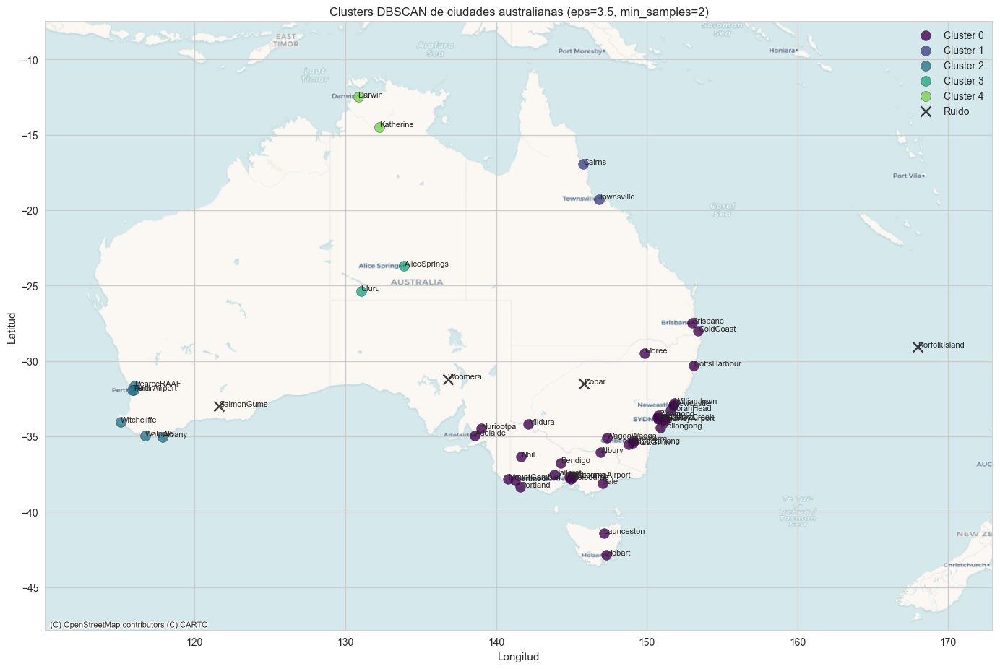


Ciudades en cada cluster:
Ruido (sin cluster): Cobar, NorfolkIsland, Woomera, SalmonGums
Cluster 0: Albury, BadgerysCreek, CoffsHarbour, Moree, Newcastle, NorahHead, Penrith, Richmond, Sydney, SydneyAirport, WaggaWagga, Williamtown, Wollongong, Canberra, Tuggeranong, MountGinini, Ballarat, Bendigo, Sale, MelbourneAirport, Melbourne, Mildura, Nhil, Portland, Watsonia, Dartmoor, Brisbane, GoldCoast, Adelaide, MountGambier, Nuriootpa, Hobart, Launceston
Cluster 1: Cairns, Townsville
Cluster 2: Albany, Witchcliffe, PearceRAAF, PerthAirport, Perth, Walpole
Cluster 3: AliceSprings, Uluru
Cluster 4: Darwin, Katherine


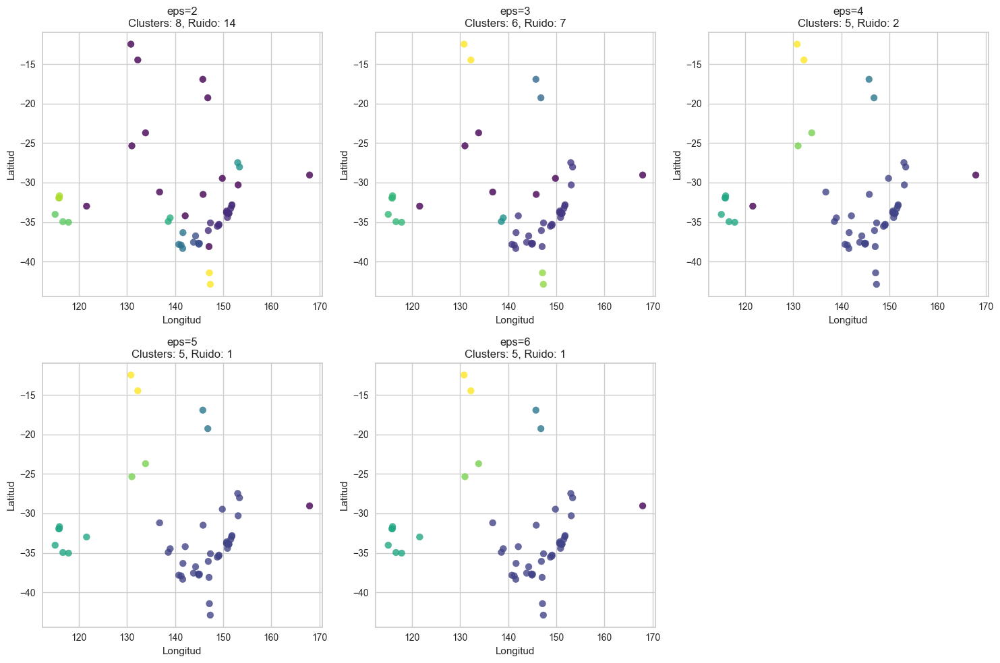


Comparación K-means vs DBSCAN:
              Ciudad  Cluster  Cluster_DBSCAN              Nombre_Región  \
2              Cobar        0              -1         Queensland Central   
41        SalmonGums        1              -1       Australia Occidental   
35           Woomera        0              -1         Queensland Central   
7      NorfolkIsland        2              -1           Territorio Norte   
0             Albury        0               0         Queensland Central   
22         Melbourne        0               0         Queensland Central   
23           Mildura        0               0         Queensland Central   
25          Portland        0               0         Queensland Central   
26          Watsonia        0               0         Queensland Central   
27          Dartmoor        0               0         Queensland Central   
28          Brisbane        2               0           Territorio Norte   
32          Adelaide        0               0         Qu

In [106]:
# Usando las coordenadas que ya tienes
X = coords_df[['Latitud', 'Longitud']].values

# Parámetros para DBSCAN
# eps: radio de búsqueda (ajusta según la dispersión geográfica)
# min_samples: mínimo de puntos para formar un cluster
eps = 3.5  # Puedes ajustar este valor
min_samples = 2

# Aplicar DBSCAN
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
coords_df['Cluster_DBSCAN'] = dbscan.fit_predict(X)

# Contar clusters (excluyendo ruido que es -1)
n_clusters_dbscan = len(set(coords_df['Cluster_DBSCAN'])) - (1 if -1 in coords_df['Cluster_DBSCAN'] else 0)
n_noise = list(coords_df['Cluster_DBSCAN']).count(-1)

print(f'Número de clusters encontrados: {n_clusters_dbscan}')
print(f'Número de puntos de ruido: {n_noise}')

# Visualización
plt.figure(figsize=(14, 12))
ax = plt.gca()

# Colorear según cluster (ruido en negro)
unique_labels = set(coords_df['Cluster_DBSCAN'])
colors = plt.cm.viridis(np.linspace(0, 1, len(unique_labels)))

for k, col in zip(unique_labels, colors):
    if k == -1:
        # Ruido en negro
        col = 'k'
        marker = 'x'
    else:
        marker = 'o'

    class_member_mask = (coords_df['Cluster_DBSCAN'] == k)
    xy = coords_df[class_member_mask][['Longitud', 'Latitud']]

    ax.scatter(xy['Longitud'], xy['Latitud'], c=[col], marker=marker,
              s=100, alpha=0.8, edgecolor='k', label=f'Cluster {k}' if k != -1 else 'Ruido')

# Etiquetas de ciudades
for i, row in coords_df.iterrows():
    ax.text(row['Longitud'], row['Latitud'], row['Ciudad'], fontsize=8)

# Mapa base
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Voyager)

# Límites
min_lon = coords_df['Longitud'].min() - 5
max_lon = coords_df['Longitud'].max() + 5
min_lat = coords_df['Latitud'].min() - 5
max_lat = coords_df['Latitud'].max() + 5
ax.set_xlim(min_lon, max_lon)
ax.set_ylim(min_lat, max_lat)

plt.legend()
plt.title(f'Clusters DBSCAN de ciudades australianas (eps={eps}, min_samples={min_samples})')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.tight_layout()
plt.show()

# Ver las ciudades en cada cluster
print("\nCiudades en cada cluster:")
for cluster in sorted(coords_df['Cluster_DBSCAN'].unique()):
    ciudades_cluster = coords_df[coords_df['Cluster_DBSCAN'] == cluster]['Ciudad'].tolist()
    if cluster == -1:
        print(f"Ruido (sin cluster): {', '.join(ciudades_cluster)}")
    else:
        print(f"Cluster {cluster}: {', '.join(ciudades_cluster)}")

# Experimentar con diferentes valores de eps
eps_values = [2, 3, 4, 5, 6]
plt.figure(figsize=(15, 10))

for i, eps_val in enumerate(eps_values):
    dbscan_temp = DBSCAN(eps=eps_val, min_samples=2)
    labels = dbscan_temp.fit_predict(X)

    plt.subplot(2, 3, i+1)
    plt.scatter(coords_df['Longitud'], coords_df['Latitud'],
               c=labels, cmap='viridis', s=50, alpha=0.8)

    n_clusters_temp = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_temp = list(labels).count(-1)

    plt.title(f'eps={eps_val}\nClusters: {n_clusters_temp}, Ruido: {n_noise_temp}')
    plt.xlabel('Longitud')
    plt.ylabel('Latitud')

plt.tight_layout()
plt.show()

# Asignar nombres a las regiones basándose en los clusters encontrados
# (ajusta según los resultados que obtengas)
nombres_regiones_dbscan = {}
for i in range(n_clusters_dbscan):
    nombres_regiones_dbscan[i] = f'Región {i}'
nombres_regiones_dbscan[-1] = 'Sin Región'  # Para puntos de ruido

coords_df['Region_DBSCAN'] = coords_df['Cluster_DBSCAN'].map(nombres_regiones_dbscan)

'''# Crear el mapeo final para el dataframe original
mapeo_ciudad_region_dbscan = dict(zip(coords_df['Ciudad'], coords_df['Region_DBSCAN']))
df_ciudades['Region_DBSCAN'] = df_ciudades['Location'].map(mapeo_ciudad_region_dbscan)'''

# Comparar resultados
print("\nComparación K-means vs DBSCAN:")
comparacion = coords_df[['Ciudad', 'Cluster', 'Cluster_DBSCAN', 'Nombre_Región', 'Region_DBSCAN']]
print(comparacion.sort_values('Cluster_DBSCAN'))

Nos parece que la mejor opcion es 4 ya que si no se empizan a dividir las mismas regiones en otras cuando estan en el mismo lugar, lo cual no tiene sentido porque puede ser muy probable que si estan cerca tenga una prediccion parecida o que tenga la misma prediccion y realmente sea acertada para las dos regiones.

# Ejercicio 2

2. Realizar un análisis descriptivo, que ayude a la comprensión del problema, de cada una de las variables involucradas, detallando: características, comportamiento y rango de variación. ¿Qué es cada variable?

Debe incluir:
* Análisis y decisión sobre datos faltantes.
* Visualización de datos (por ejemplo histogramas, scatterplots entre variables, diagramas de caja)
* ¿Está balanceado el dataset? ¿Por qué cree que hacemos esta pregunta?
* Codificación de variables categóricas (si se van a utilizar para predicción).
* Matriz de correlación de variables.
* Estandarización/escalado de datos.
* Validación cruzada train - test. Realizar una división del conjunto de datos en conjuntos de entrenamiento y prueba (y si se quiere, se puede incluir validación, que luego será útil) en el MOMENTO donde lo crean adecuado.

Explicacion de cada Variable

Date: es la fecha en la que se registraron todos las variables climaticas.

MinTemp: la temperatura minima del dia registrado en Date.

MaxTemp: la temperatura maxima del dia registrado en Date.

Rainfall: cantidad de milimetros de agua caida.

Evaporation: evaporacion del agua.

Sunshine: cantidad de horas de sol.

WindGustDir: direccion del viento mas fuerte.

WindGustSpeed: velocidad del viento mas fuerte.

WindDir9am: direccion del viento a las 9 am.

WindDir3pm: direccion del viento a las 3 pm.

WindSpeed9am: velocidad del viento a las 9 am.

WindSpeed3pm: velocidad del viento a las 3 pm.

Humidity9am: humedad a las 9 am.

Humidity3pm: humedad a las 3 pm.

Pressure9am: presion atmosferica a las 9 am.

Pressure3pm: presion atmosferica a las 3 pm.

Cloud9am: nubosidad a las 9 am.

Cloud3pm: nubosidad a las 3 pm.

Temp9am: temperatura a las 9 am.

Temp3pm: temperatura a las 3 pm.

RainToday: si hubo lluvia el dia de la fecha.

RainTomorrow: si va a llover mañana.

Region: son 4 regiones en las que estan divididas las ciudades de australia, de las cuales se saco informacion.


In [107]:
df_ciudades = df_ciudades.drop('Location',axis = 1)

Tenemos 145.460n registros con 23 columnas de datos.

La cantidad de datos que faltan en las columnas es:
Date                 0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
Region               0
dtype: int64

Porcentaje de valores faltantes por columna:
Date              0.000000
MinTemp           1.020899
MaxTemp           0.866905
Rainfall          2.241853
Evaporation      43.166506
Sunshine         48.009762
WindGustDir       7.098859
WindGustSpeed     7.055548
WindDir9am        7.263853
WindDir3pm        2.906641
WindSpeed9am      1.214767
WindSpeed3pm      2.105046
Humidity9am       1.824557
Humidity3

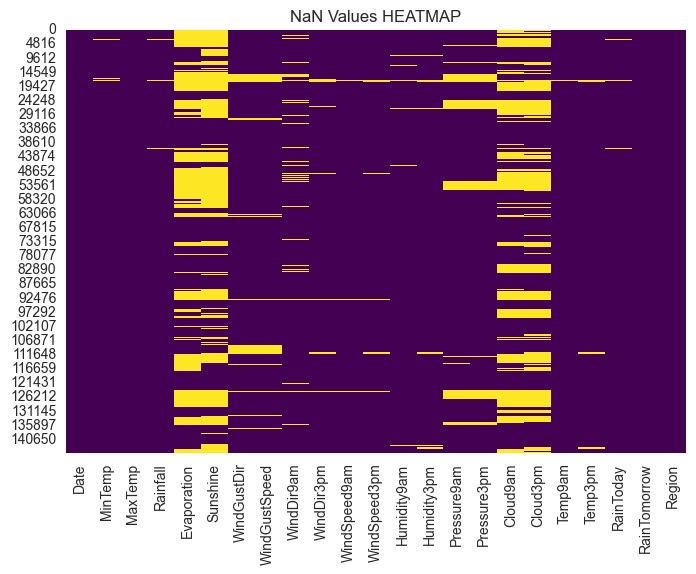

In [108]:
# Obtenemos con true o false las columnas null y luego las sumamos para saber que cantidad de valores faltantes tenemos por cada columna.
weather_null = df_ciudades.isnull().sum()

# Calcular el porcentaje de valores faltantes
porcentaje_faltantes = (weather_null / len(df_ciudades)) * 100

print('La cantidad de datos que faltan en las columnas es:')
print(weather_null)
print("\nPorcentaje de valores faltantes por columna:")
print(porcentaje_faltantes)

# Eliminamos las columnas de la clase donde tengan valos nan ya que estos registros no nos sirven para el entrenamiento del modelo.
# Ya que dicho valor a predecir no existe.
weather_depurado = df_ciudades.dropna(subset=['RainTomorrow'])

# Mostramos la cantidad de datos faltantes con un Heatmap, donde cada linea amarilla indica que tiene un nan en ese indice de cregistro.
sns.heatmap(weather_depurado.isnull(), cbar=False, cmap='viridis')
plt.title('NaN Values HEATMAP')
plt.show()

# Conclusion: observamos que tenemos una cantidad alta de datos faltantes en la mayoria de las columnas.

Eliminamos 3267 registros que tenían valores nulos en la columna RainTomorrow   

Conclusion: observamos que tenemos una cantidad alta de datos faltantes en varias columnas, menos en la facha de registro del dato y la region donde se registro. Observamos que tenemos varias columnas que son categoricas, por lo tanto primero las transformamos a numericas y luego completamos los faltantes

DECISIÓN:

Hemos identificado la cantidad y el porcentaje de valores faltantes en cada columna. Lo cual es consistente en el heatmap, donde las columnas poseen una alta densidad de color amarillo. Dependiendo del porcentaje, decidiremos si imputar o eliminar los valores faltantes. Por ejemplo, si una columna tiene más del 30% de valores faltantes, podríamos considerar eliminarla.

Las columnas con un valor de datos faltantes mayor al 30% son:

* Evaporation
* Sunshine
* Cloud9am
* Cloud3pm

Sin embargo, no las eliminaremos a las columnas porque mas adelante en el analisis se aprecia que estas variables son significativas con respecto a la variable objetivo.

Tambien, debemos eliminar las filas donde RainTomorrow tiene un valor NaN, ya que esto no nos permitiria entrenar el modelo.

In [109]:
# Convertir Date de una columna que contiene los dias a contener solamente los meses
weather_depurado['Date'] = pd.to_datetime(weather_depurado['Date'])
weather_depurado['Date'] = weather_depurado['Date'].dt.month

Tenemos la variable «Date», que contiene la fecha exacta (año, mes y día), que no es relevante, pero al convertirla a mes, podemos ignorar los años y mantener el modelo funcional con el paso del tiempo. Además, generamos una variable Mes más significativa que el día exacto.

Conservamos el nombre de la columna como Date, pero tiene un nuevo significado, simplemente sera el Mes

In [110]:
weather_depurado

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Region
0,12,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,Queensland Central
1,12,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,Queensland Central
2,12,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,Queensland Central
3,12,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,Queensland Central
4,12,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,Queensland Central
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,6,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,E,...,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No,Nueva Gales del Sur Norte
145455,6,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,...,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No,Nueva Gales del Sur Norte
145456,6,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,...,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No,Nueva Gales del Sur Norte
145457,6,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,...,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,Nueva Gales del Sur Norte


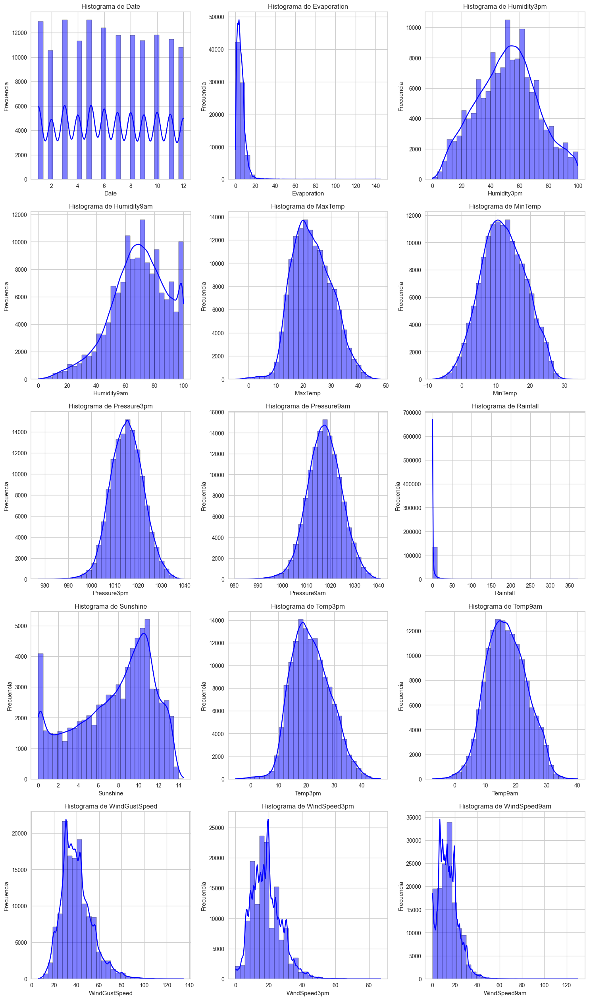

In [111]:
# Histogramas de las variables numericas

# Seleccionar solo las columnas numéricas
columnas_numericas = weather_depurado.select_dtypes(include=['float64', 'int64']).columns.difference(['Cloud9am', 'Cloud3pm'])
# Crear una figura con un grid de subplots
fig, axes = plt.subplots(nrows=(len(columnas_numericas) + 1) // 2, ncols=3, figsize=(15, 5 * ((len(columnas_numericas) + 1) // 2)))

# Aplanar el array de axes para facilitar la iteración
axes = axes.flatten()

# Generar histogramas para cada columna numérica usando Seaborn
for i, col in enumerate(columnas_numericas):
    sns.histplot(weather_depurado[col], ax=axes[i], kde=True, color='blue', bins=30)
    axes[i].set_title(f'Histograma de {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frecuencia')

# Ocultar los ejes vacíos si el número de columnas es impar
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar el espacio entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

**Conclucion:**

Podemos ver que la mayoria de las variables tienen una forma acampanada
* Humidity3pm
* MinTemp
* MaxTemp
* Pressure3pm
* Pressure9am
* Temp9am
* Temp3pm

Tambien podemos ver como otras estan sesgadas hacia la derecha o hacia la izquierda y con lasgas colas que pueden ser outliers que luego analizaremos.

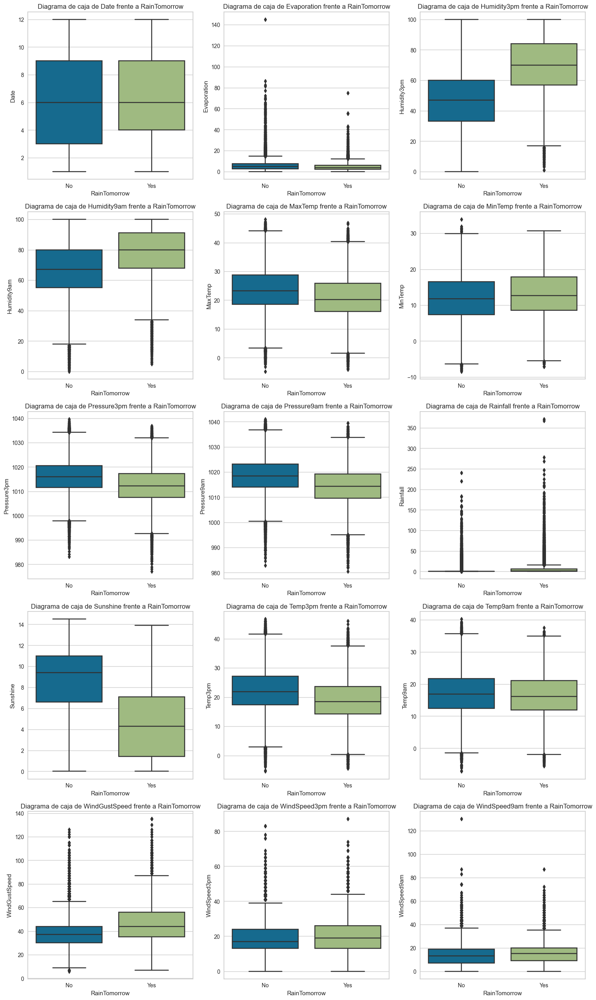

In [112]:
# Graficos de las variables numericas frente a variable objetivo RainTomorrow

# Seleccionar solo las columnas numéricas
columnas_numericas = weather_depurado.select_dtypes(include=['float64', 'int64']).columns.difference(['Cloud9am', 'Cloud3pm'])

# Crear una figura con un grid de subplots
fig, axes = plt.subplots(nrows=(len(columnas_numericas) + 1) // 2, ncols=3, figsize=(15, 5 * ((len(columnas_numericas) + 1) // 2)))

# Aplanar el array de axes para facilitar la iteración
axes = axes.flatten()

# Generar diagramas de caja para cada columna numérica frente a RainTomorrow usando Seaborn
for i, col in enumerate(columnas_numericas):
    sns.boxplot(x='RainTomorrow', y=col, data=weather_depurado, ax=axes[i])
    axes[i].set_title(f'Diagrama de caja de {col} frente a RainTomorrow')
    axes[i].set_xlabel('RainTomorrow')
    axes[i].set_ylabel(col)

# Ocultar los ejes vacíos si el número de columnas es impar
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar el espacio entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

**APRECIACIÓN:**

Lo que podemos analizar en la grafica anterior, es el cambio de distribuciones cuando una variable posee que RainTomorrow es NO o SI.

Podemos ver como Humidity3pm Genera un cambio de distribucion significativo cuando RainTomorrow es positivo, es decir que es una variable que tiene una alta significacion en RainTomorrow.

Sunshine tambien es una variable que tiene un cambio de distribucion significativo cuando RainTomorrow es SI.

Variables como Temp9am por ejemplo, no cambia su distribucion con respecto a RainTomorrow, lo que nos indicaria que no debe ser una variable significativa.

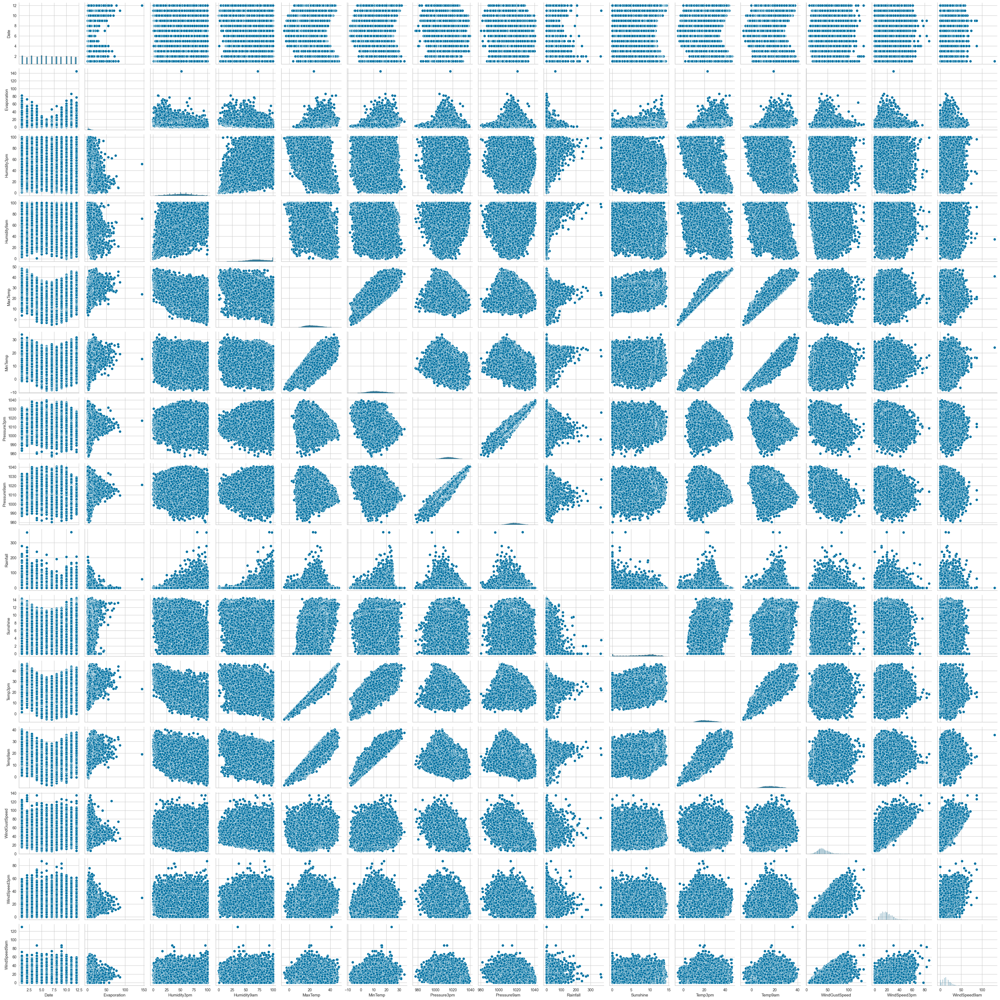

In [113]:
# Seleccionar solo las columnas numéricas
columnas_numericas = weather_depurado.select_dtypes(include=['float64', 'int64']).columns.difference(['Cloud9am', 'Cloud3pm'])

# Crear un DataFrame con las columnas numéricas y la columna objetivo
df_numericas = weather_depurado[columnas_numericas]
df_numericas['RainTomorrow'] = weather_depurado['RainTomorrow']

# Generar el pairplot
sns.pairplot(df_numericas)

# Mostrar la figura
plt.show()

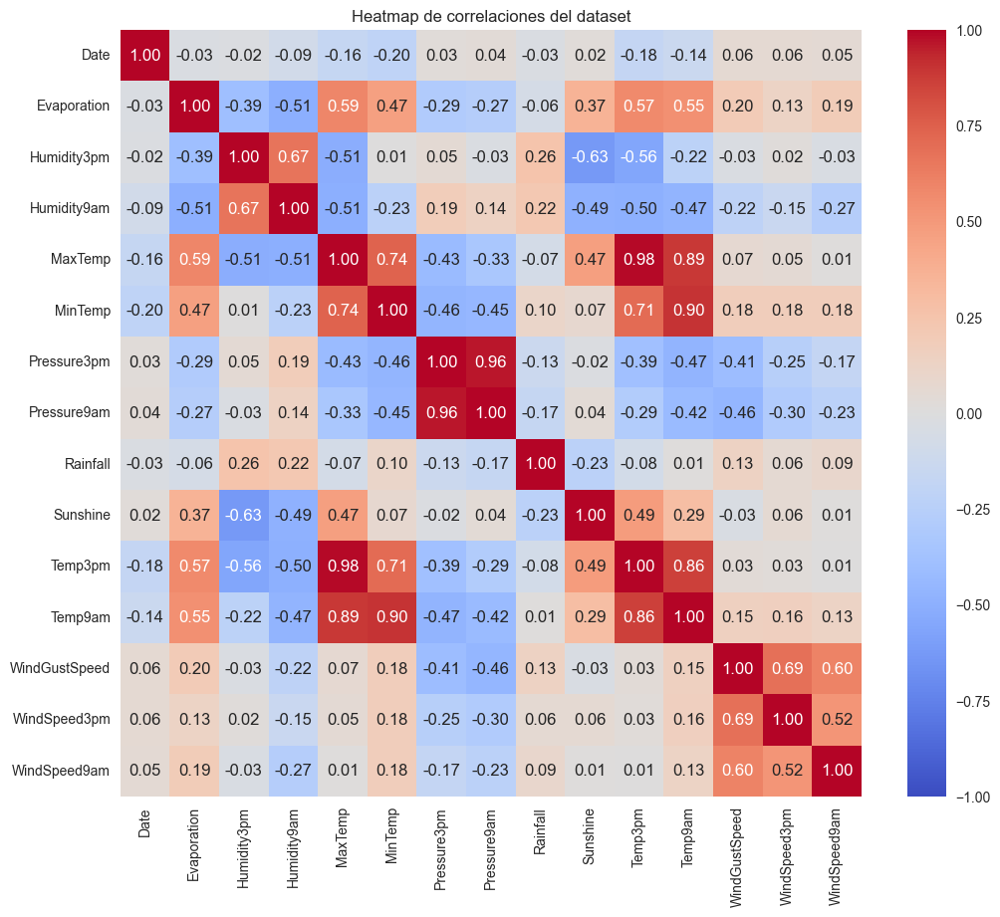

In [114]:
# Seleccionar solo las columnas numéricas
columnas_numericas = weather_depurado.select_dtypes(include=['float64', 'int64']).columns.difference(['Cloud9am', 'Cloud3pm'])

# Calcular la matriz de correlación
matriz_correlacion = weather_depurado[columnas_numericas].corr()

# Generar el heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_correlacion, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1)

# Título para el heatmap
plt.title('Heatmap de correlaciones del dataset')
plt.show()


**Conclucion:**

Podemos ver como la mayoria de las variables no tienen una dependencia entre si significativa.

Mientras que existen variables que tienen dependencias lineales que resultan significativas. Esto se puede ver en el Heatmap.

Podemos ver que tenemos varias correlacines con una fuerte correlasion como Temp3pm con Maxtemp de 0.98 con lo que puede ser que coincidan las temperaturas de esa hora como las maximas temperaturas dia.

Tambien tenemos mas correlasiones fuerte positivas como Temp9am y Mintemp, Temp9am y Maxtemp, Temp9am y Temp3pm, entre otras mas.

Tambien tenemos correlaciones negativas, la cual la mas fuerte es de sunchine con Humidity3pm con 0,63.

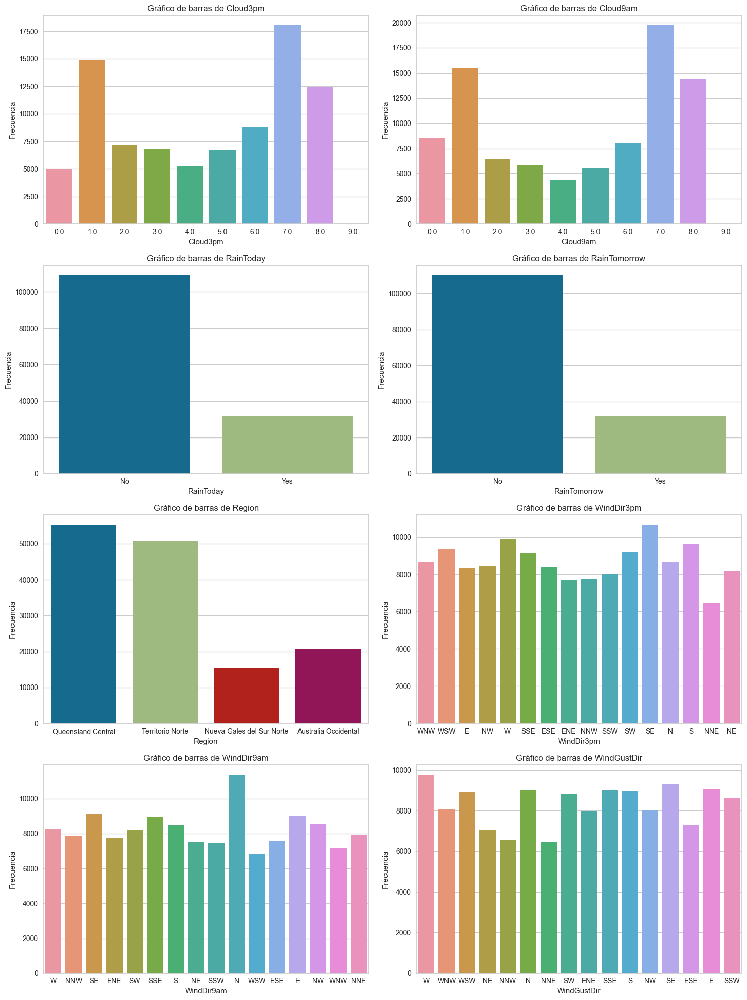

In [115]:
# Graficos de barra de las variables categoricas


# Seleccionar solo las columnas categóricas
columnas_categoricas = weather_depurado.select_dtypes(include=['object', 'category', 'int32']).columns.union(['Cloud9am', 'Cloud3pm'])

# Crear una figura con un grid de subplots
fig, axes = plt.subplots(nrows=(len(columnas_categoricas) + 1) // 2, ncols=2, figsize=(15, 5 * ((len(columnas_categoricas) + 1) // 2)))

# Aplanar el array de axes para facilitar la iteración
axes = axes.flatten()

# Generar gráficos de barras para cada columna categórica usando Seaborn
for i, col in enumerate(columnas_categoricas):
    sns.countplot(x=col, data=weather_depurado, ax=axes[i])
    axes[i].set_title(f'Gráfico de barras de {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frecuencia')

# Ocultar los ejes vacíos si el número de columnas es impar
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar el espacio entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

**Conclusion:**

Las variables categoricas que tenemos, tienen frecuencias similares para cualquier direccion.

Lo que podemos resaltar es que RainToday, y RainTomorrow, tienen una frecuencia significativamente mayor de NO, que de SI

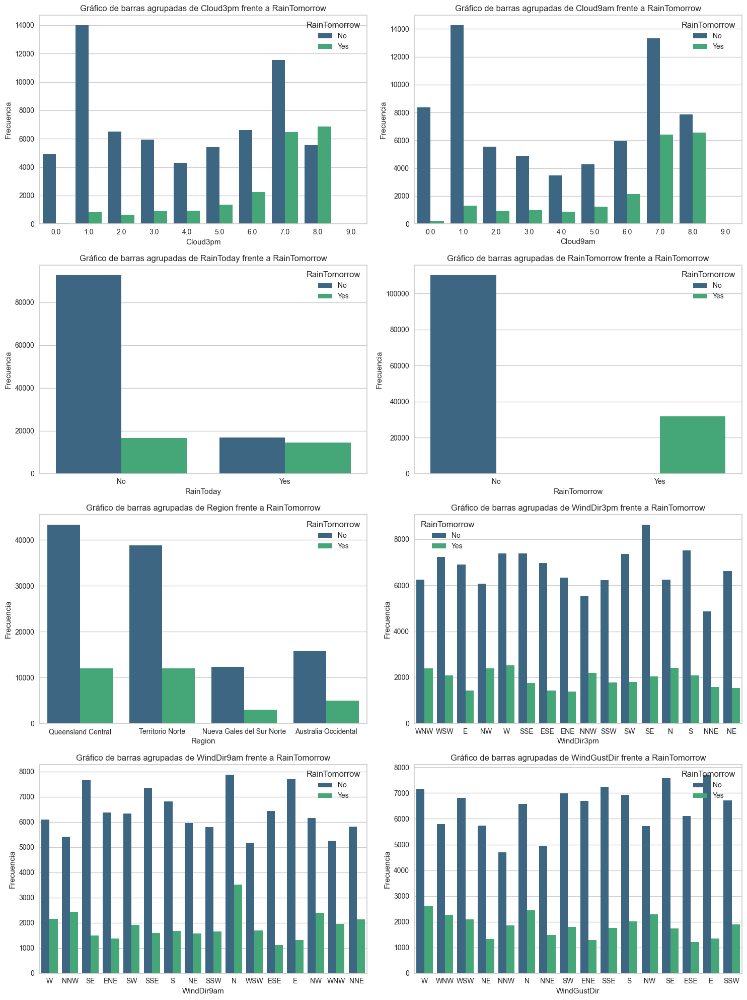

In [116]:
# Graficos de las variables categoricas frente a variable objetivo RainTomorrow

# Seleccionar solo las columnas categóricas
columnas_categoricas = weather_depurado.select_dtypes(include=['object', 'category', 'int32']).columns.union(['Cloud9am', 'Cloud3pm'])

# Crear una figura con un grid de subplots
fig, axes = plt.subplots(nrows=(len(columnas_categoricas) + 1) // 2, ncols=2, figsize=(15, 5 * ((len(columnas_categoricas) + 1) // 2)))

# Aplanar el array de axes para facilitar la iteración
axes = axes.flatten()

# Generar gráficos de barras agrupadas para cada columna categórica frente a RainTomorrow usando Seaborn
for i, col in enumerate(columnas_categoricas):
    sns.countplot(x=col, hue='RainTomorrow', data=weather_depurado, ax=axes[i], palette='viridis')
    axes[i].set_title(f'Gráfico de barras agrupadas de {col} frente a RainTomorrow')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frecuencia')

# Ocultar los ejes vacíos si el número de columnas es impar
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar el espacio entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

**Conclusion:**

Podemos ver en las graficas que ninguna categorizacion en las primeras 3 graficas, favorece la Lluvia al dia siguiente sobre la no lluvia.

En el caso de RainToday, teniendo en cuenta RainTomorrow.

Es interesante analizar como, las frecuencias de RainTomorrow condicionadas a RainToday, resultan similares a ser un 50/50.

Es importante ver la tendencia de la grafica de Date, podemos ver como entre los meses 5 y 9, aumenta la proporcion de RainTomorrow como SI. Esto es coherente teniendo en cuenta que entre Mayo y Septiembre, nos encontramos en temporada de Invierno en Australia, el cual se caracteriza por tener una mayor proporcion de Lluvia con respecto a otras estaciones.

Se puede apreciar claramente como Cloud9am y Cloud3pm son variables que a medida que aumentan, la frecuencia de RainTomorrow esta en aumento.

Balance de la variable 'RainTomorrow':
No     77.581878
Yes    22.418122
Name: RainTomorrow, dtype: float64


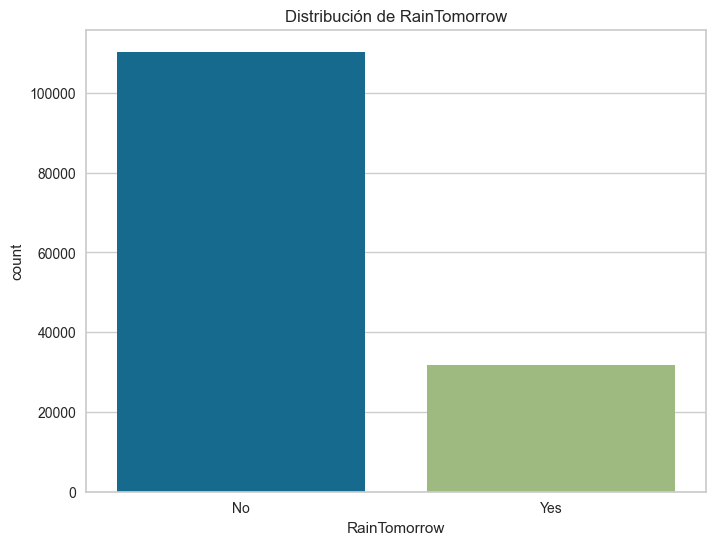

In [117]:
# Verificar el balance de la variable objetivo
balance = weather_depurado['RainTomorrow'].value_counts(normalize=True) * 100
print("Balance de la variable 'RainTomorrow':")
print(balance)

# Gráfico de barras para visualizar el balance
plt.figure(figsize=(8, 6))
sns.countplot(x='RainTomorrow', data=weather_depurado)
plt.title('Distribución de RainTomorrow')
plt.show()

Conclucion:

Podemos ver que tenemos un gran desbalance entre los dias que no llueven vs los dias que si llueven por lo que cuando entrenemos el modelo con estas cantidades vamos a ver afectado el modelo y va a tender a predecir mas dias que no llovia que dias que si.

Tenemos que realizar un sobmuestreo o un sobremuestreo, para balancar todo el dataset y no tener esa tendencia a que no llovio. Tambien podemos darles mas pesos a los dias de lluvia a la hora de la prediccion para que balance y no tengamos que repetir datos o eliminar.

-----------------------------------------------------------------
Decidimos codificar las variables categoricas de RainToday y RainTomorrow en 0 y 1 A su vez decidimos codificar las variables categoricas de Direcciones cardinales en angulos, y descomponerlos en sus componentes en X y en Y, a partir del seno-coseno.

In [118]:
# En las columnas 'WindGustDir', 'WindDir9am' y 'WindDir3pm' tenemos los puntos cardinales , donde son 16 en total.
# Estos 16 puntos cardinales los transformamos en sus repectivos grados, para luego aplicarle una transformacion
# llamada sen-cos la cual es muy util para varibles ciclicas como lo son estas. Creando por cada variable 2 columnas,
# una para seno y otra para coseno.
cardinal_to_angle = {
    'N': 0,
    'NNE': 22.5,
    'NE': 45,
    'ENE': 67.5,
    'E': 90,
    'ESE': 112.5,
    'SE': 135,
    'SSE': 157.5,
    'S': 180,
    'SSW': 202.5,
    'SW': 225,
    'WSW': 247.5,
    'W': 270,
    'WNW': 292.5,
    'NW': 315,
    'NNW': 337.5,
}

# Reemplazamops los puntos cardinales por sus respectivos angulos.
weather_depurado['WindGustDir'] = weather_depurado['WindGustDir'].replace(cardinal_to_angle)
weather_depurado['WindDir9am'] = weather_depurado['WindDir9am'].replace(cardinal_to_angle)
weather_depurado['WindDir3pm'] = weather_depurado['WindDir3pm'].replace(cardinal_to_angle)

# Calculamos las coordenadas seno y coseno para la variable 'WindGustDir'.
weather_depurado['WindGustDir_Sen'] = np.sin(weather_depurado['WindGustDir'])
weather_depurado['WindGustDir_Cos'] = np.cos(weather_depurado['WindGustDir'])


# Calculamos las coordenadas seno y coseno para la variable 'WindDir9am'.
weather_depurado['WindDir9am_Sen'] = np.sin(weather_depurado['WindDir9am'])
weather_depurado['WindDir9am_Cos'] = np.cos(weather_depurado['WindDir9am'])

# Calculamos las coordenadas seno y coseno para la variable 'WindDir3pm'.
weather_depurado['WindDir3pm_Sen'] = np.sin(weather_depurado['WindDir3pm'])
weather_depurado['WindDir3pm_Cos'] = np.cos(weather_depurado['WindDir3pm'])

#Eliminamos las varibles 'WindGustDir', 'WindDir9am' y 'WindDir3pm' ya que no van a ser necesarias para el entrenamiento de nuestro modelo.

weather_depurado = weather_depurado.drop(columns=['WindGustDir'])
weather_depurado = weather_depurado.drop(columns=['WindDir9am'])
weather_depurado = weather_depurado.drop(columns=['WindDir3pm'])

# Creamos las variables dummy para las columna 'Region'.
# Para la cual hicimos 4 clusters para cada region de Australia con 1 si es a la region deonde esta la ciudad que pertencia y 0 si no lo es.
weather_depurado = pd.get_dummies(weather_depurado, columns=['Region'],drop_first=True)

weather_depurado['RainTomorrow'] = weather_depurado['RainTomorrow'].replace('Yes',1)
weather_depurado['RainTomorrow'] = weather_depurado['RainTomorrow'].replace('No',0)
weather_depurado['RainToday'] = weather_depurado['RainToday'].replace('Yes',1)
weather_depurado['RainToday'] = weather_depurado['RainToday'].replace('No',0)



Realizamos los senos y cosenos de los estas columnas ya que realizan un siclo y es mejor para que cuando el algoritmo lo tenga asi para que no interprete mnal cuando obtenga los valores y tengamos unos mucho mas grande que otros y el algoritmo no puede resolver bien.

In [119]:
# Separamos las columnas del dataset en dos conjuntos:
# por un lado, las características ('X'), y por otro, la clase a predecir ('y').
X = weather_depurado.drop('RainTomorrow', axis=1)
y = weather_depurado['RainTomorrow']

# Dividimos nuestro conjunto de datos en dos partes:
# un conjunto de entrenamiento y un conjunto de prueba.
# La división de los datos es 80/20, donde el 80% se utiliza para entrenamiento
# y el 20% restante para realizar pruebas.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convertimos los conjuntos de entrenamiento y prueba a DataFrames para mantener la estructura del dataset original.
X_train = pd.DataFrame(X_train)
X_test = pd.DataFrame(X_test)

HISTOGRAM



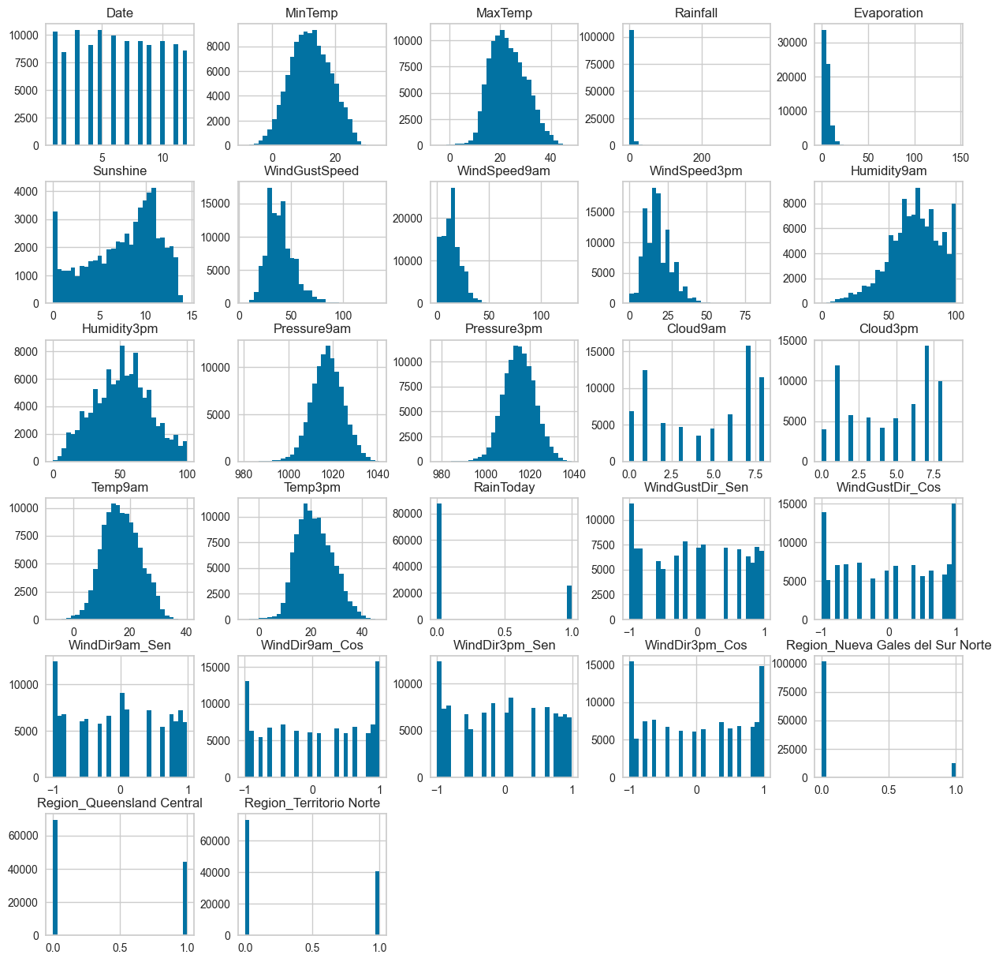

In [120]:
# Generamos un histograma para visualizar la distribución de cada columna del dataset,
# excluyendo la variable a predecir ('RainTomorrow').
print('HISTOGRAM')
print('')
# Creamos histogramas de todas las columnas de X_train en una figura con un diseño ajustado.
X_train.hist(bins=30, figsize=(15, 15))
# Mostramos la figura con todos los histogramas.
plt.show()

Conclusión: podemos observar que muchas de las variables se muestran de manera gaussiana como por ejemplo 'MinTemp'. Otras la vemos más sesgadas hacia uno de los laterales como por ejemplo 'Humidity9am' y las demás son variables categóricas transformadas que no presentan un patrón.

In [121]:
def mixed_method(X_train, X_test, columns_mean, columns_median, columns_mode, columns_knn):
    # Imputación de valores faltantes utilizando un "MÉTODO MIXTO".
    # Se realiza imputación estadística (SimpleImputer) para algunas columnas y KNNImputer para otras.

    # Creación de imputadores para diferentes estrategias.
    imputer_mean = SimpleImputer(strategy='mean')
    imputer_median = SimpleImputer(strategy='median')
    imputer_mode = SimpleImputer(strategy='most_frequent')
    imputer_knn = KNNImputer(n_neighbors=5)

    # Creación de un ColumnTransformer para aplicar diferentes estrategias de imputación por columna.
    preprocessor = ColumnTransformer(
        transformers=[
            ('mean', imputer_mean, columns_mean),
            ('median', imputer_median, columns_median),
            ('mode', imputer_mode, columns_mode),
            ('knn', imputer_knn, columns_knn)
        ],
        remainder='passthrough'
    )

    # Creación de un pipeline que incluye el preprocesador y el escalado de los datos.
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('scaler', StandardScaler())
    ])

    # Aplicación del pipeline a los datos de entrenamiento y prueba.
    X_train_scaled = pipeline.fit_transform(X_train)
    X_test_scaled = pipeline.transform(X_test)

    # Retornar los datos preprocesados, escalados y el pipeline completo.
    return X_train_scaled, X_test_scaled, pipeline

In [122]:
weather_null = X_train.isnull().sum()
print('La cantidad de datos que faltan en las columnas es:')
print(weather_null)

La cantidad de datos que faltan en las columnas es:
Date                                    0
MinTemp                               525
MaxTemp                               268
Rainfall                             1182
Evaporation                         48791
Sunshine                            54345
WindGustSpeed                        7406
WindSpeed9am                         1083
WindSpeed3pm                         2109
Humidity9am                          1420
Humidity3pm                          2913
Pressure9am                         11257
Pressure3pm                         11225
Cloud9am                            43041
Cloud3pm                            45767
Temp9am                               736
Temp3pm                              2206
RainToday                            1182
WindGustDir_Sen                      7458
WindGustDir_Cos                      7458
WindDir9am_Sen                       8036
WindDir9am_Cos                       8036
WindDir3pm_Sen          

En todas las columnas tenemos valores faltantes menos en 'Date' y las columnas de las regiones.

In [123]:
# Hemos seleccionado un método de imputación de valores faltantes específico para cada columna,
# basado en las distribuciones observadas en las gráficas:
# - Para distribuciones más gaussianas, aplicamos la **media**.
# - Para columnas con datos concentrados en un rango muy pequeño, aplicamos la **moda**.
# - Para columnas con sesgos hacia alguno de los extremos, aplicamos la **mediana**.
# - Para el resto de las columnas, utilizamos el método de imputación de **K vecinos**,
#   para que el valor a imputar tenga en cuenta los valores de los vecinos.

mean= ['MinTemp', 'MaxTemp', 'WindGustSpeed', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']

mode = [ 'Rainfall','Sunshine', 'WindSpeed9am']

median = ['Humidity9am','Humidity3pm', 'Evaporation', 'WindSpeed3pm']

knn = ['Cloud9am', 'Cloud3pm','RainToday', 'WindGustDir_Sen', 'WindGustDir_Cos',
       'WindDir9am_Sen', 'WindDir9am_Cos', 'WindDir3pm_Sen', 'WindDir3pm_Cos']



# Aplicamos el método mixto de imputación y escalado.
X_train_scaled , X_test_scaled , pipeline = mixed_method(X_train,X_test,mean,median,mode,knn)

# Preparamos los datos escalados para realizar gráficos con SHAP.
X_train_scaled_shap = X_train_scaled
X_test_scaled_shap = X_test_scaled


# Convertimos los datos escalados en DataFrames con las mismas columnas originales,
# para realizar la regresión logística u otros análisis posteriores.
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# HAY QUE ELIMINAR LO DEMAS Y DEJAR EL PIPELINE

In [124]:
import os

os.makedirs('docker', exist_ok=True)
joblib.dump(pipeline, 'docker/preprocess.pkl')
# Salvar pipeline para inferencia
joblib.dump(pipeline, 'docker/preprocess.pkl')

['docker/preprocess.pkl']

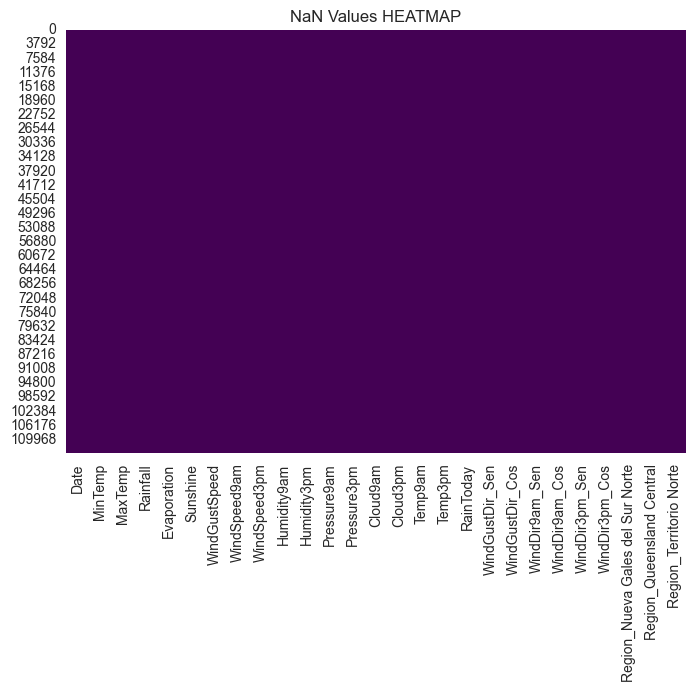

In [125]:
# Corroboramos que no hay valores faltantes en nuestro dataset de entrenamiento ya escalado.
sns.heatmap(X_train_scaled.isnull(), cbar=False, cmap='viridis')
plt.title('NaN Values HEATMAP')
plt.show()

Podemos confirmar que ya no tenemos valores faltantes en nuestro dataset de entrenamiento. Completamos los valores nulos utilizando estrategias de imputación basadas en la distribución de cada variable:

Media: para variables con distribuciones más gaussianas.
Mediana: para variables con sesgos hacia alguno de los extremos.
Moda: para variables con valores concentrados en un rango pequeño.
KNN: para variables cíclicas, como las direcciones del viento o las horas, aprovechando la relación con sus vecinos más cercanos.
Finalmente, escalamos los datos utilizando StandardScaler(), asegurando que todas las características están en una escala comparable, lo que es esencial para mejorar el rendimiento de los modelos predictivos.

# Ejercicio 3

3. Implementar la solución del problema de clasificación con regresión logística.
* Obtener las métricas adecuadas (accuracy, precision, recall, F1 score, entre otras, ¡investiguen adicionales!). Graficar matrices de confusión para cada modelo. Analizar “falsos negativos” y “falsos positivos”, ¿qué significa cada uno?
* Trazar curvas ROC para cada modelo. Comenten cuáles serían los umbrales adecuados a utilizar; ¿cómo podrían calcular el mejor umbral? ¿Es 0.5 el mejor?
* ¿Creen que han conseguido un buen fitting?



In [126]:
def metricas (y_test, y_pred):
  '''
  Calculamos métricas básicas de evaluación.
  Estas métricas son útiles para entender la proporción de verdaderos positivos (VP)
  y verdaderos negativos (VN) en las predicciones del modelo.
  '''
  accuracy = accuracy_score(y_test, y_pred)
  precision = precision_score(y_test, y_pred)
  recall = recall_score(y_test, y_pred)
  f1 = f1_score(y_test, y_pred)

  #-------------------------------------------------------------------------------------------------------------------------------

  # Balanced Accuracy: promedio entre la sensibilidad para las clases positiva y negativa.
  balanced_accuracy = balanced_accuracy_score(y_test, y_pred)

  #-------------------------------------------------------------------------------------------------------------------------------

  # Especificidad: proporción de verdaderos negativos entre todos los negativos reales.
  # En sklearn, esto se calcula como el recall para la clase negativa (etiquetada como 0).
  specificity = recall_score(y_test, y_pred, pos_label=0)

  #-------------------------------------------------------------------------------------------------------------------------------

  # Matriz de Confusión: muestra los verdaderos positivos, negativos y los errores del modelo.
  conf_matrix = confusion_matrix(y_test, y_pred)
  disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=["No Lluvia", "Lluvia"])
  disp.plot(cmap='Blues')
  plt.title("Matriz de Confusión")
  plt.show()

  #-------------------------------------------------------------------------------------------------------------------------------

  # Mostramos todas las métricas calculadas.
  print(f"Balanced Accuracy: {balanced_accuracy:.4f}")
  print(f"Especificidad (Specificity): {specificity:.4f}")
  print(f"Exactitud (Accuracy): {accuracy:.4f}")
  print(f"Precisión (Precision): {precision:.4f}")
  print(f"Sensibilidad (Recall): {recall:.4f}")
  print(f"F1 Score: {f1:.4f}")

  # Mostramos el reporte de clasificación, que incluye métricas adicionales por clase.
  print("Reporte de Clasificación:")
  print(classification_report(y_test, y_pred))

## Modelo de Regresión Logística binario

In [127]:
# Inicializamos y entrenamos un modelo de regresión logística.
# Usamos random_state=42 para garantizar la reproducibilidad de los resultados.
log_reg = LogisticRegression(max_iter=1000, random_state=42)
log_reg.fit(X_train_scaled, y_train)

LogisticRegression(max_iter=1000, random_state=42)

In [128]:
# Realizamos predicciones en el conjunto de prueba
y_pred = log_reg.predict(X_test_scaled)
y_pred_proba = log_reg.predict_proba(X_test_scaled)[:, 1]  # Probabilidades para la clase positiva

# Calculamos las métricas
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC-AUC: {roc_auc:.4f}")

ROC-AUC: 0.8563


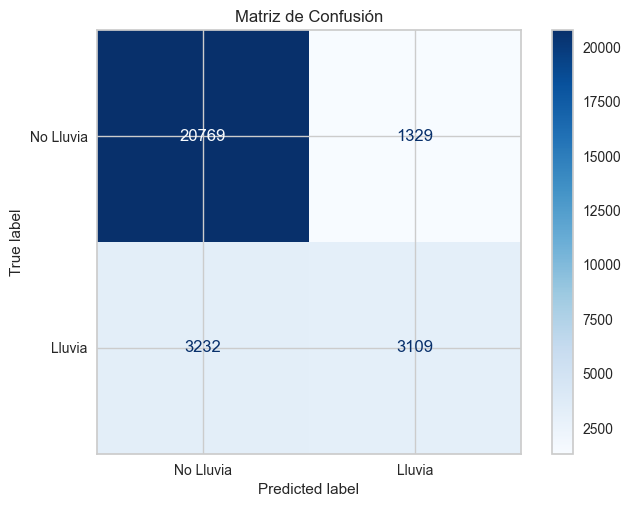

Balanced Accuracy: 0.7151
Especificidad (Specificity): 0.9399
Exactitud (Accuracy): 0.8396
Precisión (Precision): 0.7005
Sensibilidad (Recall): 0.4903
F1 Score: 0.5769
Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.87      0.94      0.90     22098
           1       0.70      0.49      0.58      6341

    accuracy                           0.84     28439
   macro avg       0.78      0.72      0.74     28439
weighted avg       0.83      0.84      0.83     28439



In [129]:
metricas(y_test, y_pred)

In [130]:
# Calculamos la curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Encontramos el mejor umbral basado en la distancia mínima al punto ideal (0, 1)
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]

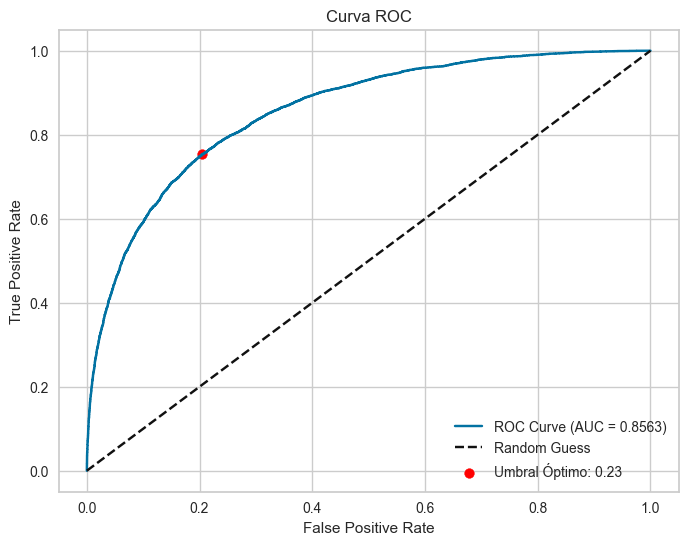

In [131]:
# Graficamos la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.4f})")
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
plt.scatter(fpr[optimal_idx], tpr[optimal_idx], color='red', label=f"Umbral Óptimo: {optimal_threshold:.2f}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC")
plt.legend()
plt.show()

**Conclucion:**

Como era de esperarce vemos que la mayoreia de las predicciones fueron hacia la clase mayoritaria teniendo un muy buen rendimiento viendo las metricas globales o las de esa clase pero si vemos el recall y el f1 vemos que fue malo, porque como vemos en las metricas solo puede detectar el 50% de los dias de llevia porque que se va a equivocas bastante.

En el umbral, que para combatir esta desigualdad a la hora de la cantidad de las predicciones, vemos que es bastante bajo de 0.22 aproximadamente.

## Modelo con muestreo balanceado

In [132]:
# Modelo con muestreo de clase
log_reg_balanceado = LogisticRegression(random_state=42, class_weight='balanced')
log_reg_balanceado.fit(X_train_scaled, y_train)

LogisticRegression(class_weight='balanced', random_state=42)

In [133]:
# Realizamos predicciones en el conjunto de prueba
y_pred_balancedo = log_reg_balanceado.predict(X_test_scaled)
y_pred_proba_balanceado = log_reg_balanceado.predict_proba(X_test_scaled)[:, 1]  # Probabilidades para la clase positiva

# Calculamos las métricas
roc_auc_balancedo = roc_auc_score(y_test, y_pred_proba_balanceado)
print(f"ROC-AUC: {roc_auc_balancedo:.4f}")

ROC-AUC: 0.8569


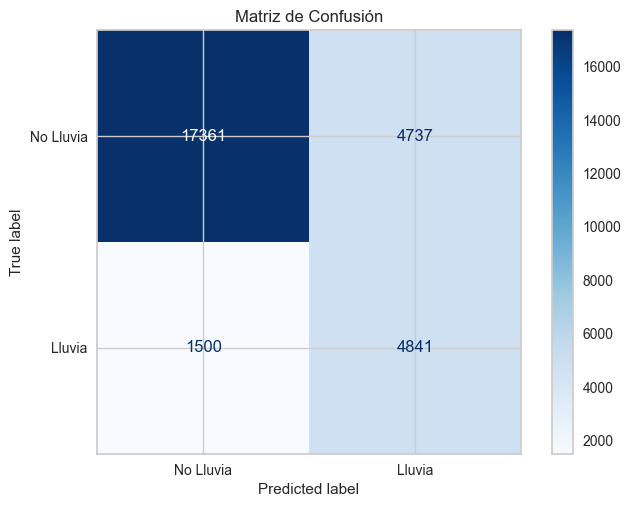

Balanced Accuracy: 0.7745
Especificidad (Specificity): 0.7856
Exactitud (Accuracy): 0.7807
Precisión (Precision): 0.5054
Sensibilidad (Recall): 0.7634
F1 Score: 0.6082
Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.92      0.79      0.85     22098
           1       0.51      0.76      0.61      6341

    accuracy                           0.78     28439
   macro avg       0.71      0.77      0.73     28439
weighted avg       0.83      0.78      0.79     28439



In [134]:
metricas(y_test, y_pred_balancedo)

In [135]:
# Calculamos la curva ROC
fpr_balanceado, tpr_balanceado, thresholds_balanceado = roc_curve(y_test, y_pred_proba_balanceado)

# Encontramos el mejor umbral basado en la distancia mínima al punto ideal (0, 1)
optimal_idx_balanceado = np.argmax(tpr_balanceado - fpr_balanceado)
optimal_threshold_balanceado = thresholds_balanceado[optimal_idx_balanceado]

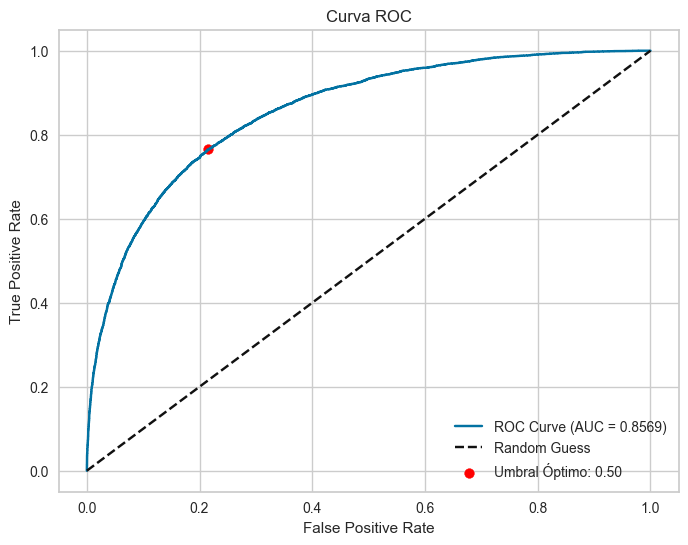

In [136]:
# Graficamos la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr_balanceado, tpr_balanceado, label=f"ROC Curve (AUC = {roc_auc_balancedo:.4f})")
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
plt.scatter(fpr_balanceado[optimal_idx_balanceado], tpr_balanceado[optimal_idx_balanceado], color='red', label=f"Umbral Óptimo: {optimal_threshold_balanceado:.2f}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC")
plt.legend()
plt.show()

**Conclucion:**

Podemos ver como ahora tenemos mas predicciones de la clase minoritaria. Elevando el rendimienti global del modelo, vemos que el recall y el f1 aumentaron pero ahora la precision bajo porque ahora predijo muchos dias que llovia pero no llovio al final. Aunque la precision alla bajado obtuvimos un mejor modelo que el anterior.

El umbral aumento a 0.46 teniendo un mayor balance. Por los que una probabilidad menor a 46 son dias de no lluvia.

# Modelo con Oversampling

In [137]:
# Aplicamos SMOTE para balancear el dataset
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

# Verificamos el balance después del oversampling
print(f"Distribución de clases antes del oversampling: {y_train.value_counts()}")
print(f"Distribución de clases después del oversampling: {pd.Series(y_train_smote).value_counts()}")

Distribución de clases antes del oversampling: 0    88218
1    25536
Name: RainTomorrow, dtype: int64
Distribución de clases después del oversampling: 0    88218
1    88218
Name: RainTomorrow, dtype: int64


Modelo con SMOTE - ROC-AUC: 0.8568


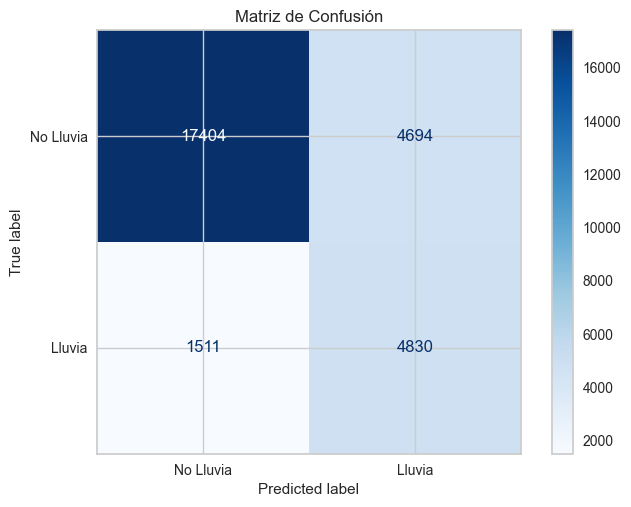

Balanced Accuracy: 0.7746
Especificidad (Specificity): 0.7876
Exactitud (Accuracy): 0.7818
Precisión (Precision): 0.5071
Sensibilidad (Recall): 0.7617
F1 Score: 0.6089
Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.92      0.79      0.85     22098
           1       0.51      0.76      0.61      6341

    accuracy                           0.78     28439
   macro avg       0.71      0.77      0.73     28439
weighted avg       0.83      0.78      0.80     28439



In [138]:
# Entrenamos el modelo con los datos balanceados
log_reg_smote = LogisticRegression(max_iter=1000, random_state=42)
log_reg_smote.fit(X_train_smote, y_train_smote)

# Realizamos predicciones
y_pred_smote = log_reg_smote.predict(X_test_scaled)
y_pred_proba_smote = log_reg_smote.predict_proba(X_test_scaled)[:, 1]

# Evaluamos el modelo
roc_auc_smote = roc_auc_score(y_test, y_pred_proba_smote)
print(f"Modelo con SMOTE - ROC-AUC: {roc_auc_smote:.4f}")

metricas(y_test, y_pred_smote)

In [139]:
# Calculamos la curva ROC para el modelo con SMOTE
fpr_smote, tpr_smote, thresholds_smote = roc_curve(y_test, y_pred_proba_smote)

# Encontramos el umbral óptimo
optimal_idx_smote = np.argmax(tpr_smote - fpr_smote)
optimal_threshold_smote = thresholds_smote[optimal_idx_smote]

print(f"Umbral óptimo para el modelo con SMOTE: {optimal_threshold_smote:.4f}")

Umbral óptimo para el modelo con SMOTE: 0.5020


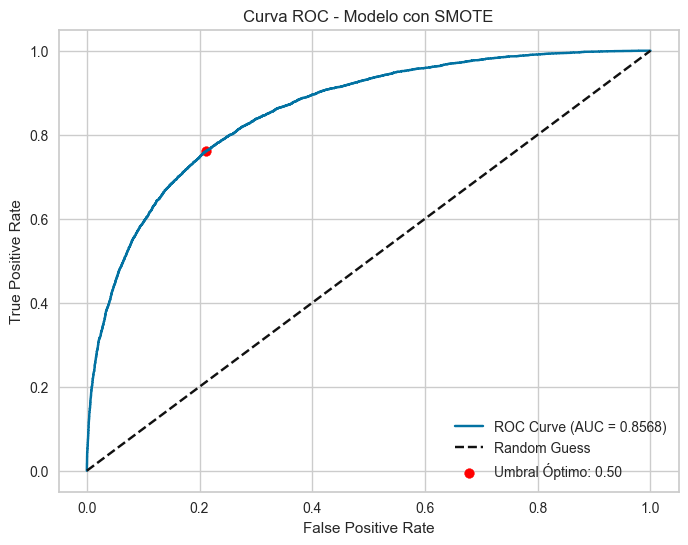

In [140]:
# Calculamos la curva ROC para el modelo con SMOTE
fpr_smote, tpr_smote, thresholds_smote = roc_curve(y_test, y_pred_proba_smote)

# Graficamos la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr_smote, tpr_smote, label=f"ROC Curve (AUC = {roc_auc_smote:.4f})")
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
plt.scatter(fpr_smote[optimal_idx_smote], tpr_smote[optimal_idx_smote], color='red', label=f"Umbral Óptimo: {optimal_threshold_smote:.2f}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Modelo con SMOTE")
plt.legend()
plt.show()

**Conclucion:**

Podemos concluir que este modelo es muy parecido, por no decir igual, al modelo balanceado. Las metricas son iguales de ambos modelos solo cambia el umbral que es de 0.48.

# Ejercicio 4


Elegimos un modelo base que se basa en el mas frecuente, ya que estamos en un problema donde tenemos un desequilibrio, por el cual podriamos considerar que nunca va a llover.

In [141]:
# Inicializamos el modelo base
dummy_clf = DummyClassifier(strategy="most_frequent", random_state=42)

# Entrenamos el modelo base
dummy_clf.fit(X_train_scaled, y_train)

DummyClassifier(random_state=42, strategy='most_frequent')

In [142]:
# Predicciones del modelo base
y_pred_dummy = dummy_clf.predict(X_test_scaled)
y_pred_proba_dummy = dummy_clf.predict_proba(X_test_scaled)[:, 1]  # Probabilidades para la clase positiva

In [143]:
# Métricas del modelo base
roc_auc_dummy = roc_auc_score(y_test, y_pred_proba_dummy)
print(f"Modelo Base - ROC-AUC: {roc_auc_dummy:.4f}")

Modelo Base - ROC-AUC: 0.5000


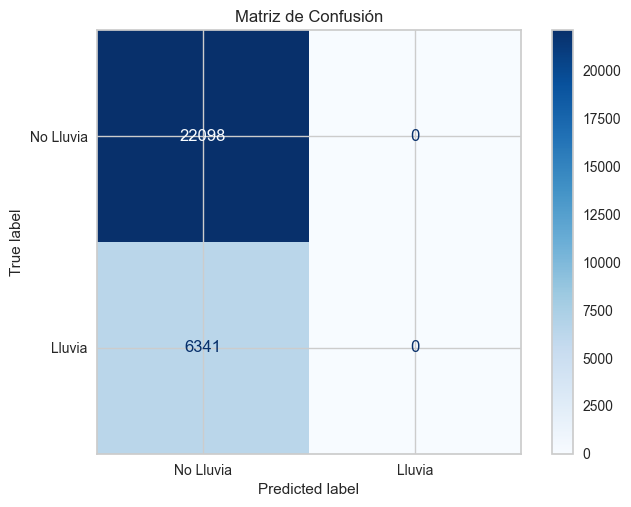

Balanced Accuracy: 0.5000
Especificidad (Specificity): 1.0000
Exactitud (Accuracy): 0.7770
Precisión (Precision): 0.0000
Sensibilidad (Recall): 0.0000
F1 Score: 0.0000
Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.78      1.00      0.87     22098
           1       0.00      0.00      0.00      6341

    accuracy                           0.78     28439
   macro avg       0.39      0.50      0.44     28439
weighted avg       0.60      0.78      0.68     28439



In [144]:
metricas(y_test, y_pred_dummy)

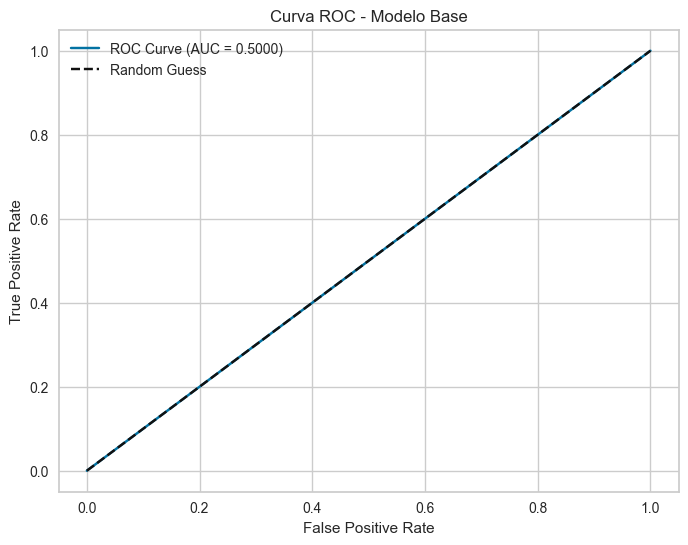

In [145]:
# Curva ROC del modelo base
fpr_dummy, tpr_dummy, thresholds_dummy = roc_curve(y_test, y_pred_proba_dummy)

plt.figure(figsize=(8, 6))
plt.plot(fpr_dummy, tpr_dummy, label=f"ROC Curve (AUC = {roc_auc_dummy:.4f})")
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Modelo Base")
plt.legend()
plt.show()

**Conclusion:**

En nuestro modelo base podemos ver q es muy malo solo predice la clase mayoritaria porque lo hicmos que lo prediga por el que mas valor tenga, que es el de no lluvia.

En si seria mejor el modelo de preddicon aleatoria, que capas predecia que algun dia si llovia.

# Ejercicio 5



In [146]:
# Espacio de búsqueda de hiperparámetros
parametros = {
    'C': [0.01, 0.1, 1, 10, 100, 300, 500],
    'solver': ['liblinear', 'saga', 'lbfgs', 'newton-cg', 'sag'],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'max_iter': [10, 50, 100, 500, 1000, 5000, 10000, 100000]
}

Para optimizar el rendimiento de mi modelo de regresión logística, definí un espacio de búsqueda de hiperparámetros que incluye los más relevantes para este tipo de algoritmo. En particular, estoy ajustando los parámetros C, solver, penalty y max_iter.

El parámetro C controla la regularización del modelo. Específicamente, representa el inverso de la fuerza de regularización, por lo que valores bajos implican una regularización más fuerte (lo que puede ayudar a evitar el sobreajuste), mientras que valores altos permiten que el modelo se ajuste más a los datos. Por eso elegí una gama amplia que va desde 0.01 hasta 500 para evaluar diferentes niveles de flexibilidad del modelo.

El hiperparámetro solver define el algoritmo de optimización que se utiliza para encontrar los coeficientes del modelo. Probé con varios solvers (liblinear, saga, lbfgs, newton-cg y sag) ya que cada uno tiene distintas características: algunos son mejores con regularización L1, otros con L2, y algunos están pensados para datasets grandes o pequeños. Esta variedad me permite encontrar el mejor desempeño según la naturaleza de mis datos.

Respecto a penalty, elegí probar con los tres tipos principales de regularización: L1 (Lasso), L2 (Ridge) y ElasticNet. Cada uno aporta beneficios distintos: L1 puede ayudar a seleccionar variables automáticamente al forzar coeficientes a cero, L2 distribuye la penalización de manera más uniforme y ElasticNet es útil cuando hay muchas variables correlacionadas.

Finalmente, incluí distintos valores de max_iter, que define la cantidad máxima de iteraciones que puede hacer el algoritmo para converger. Algunos solvers, como saga, requieren muchas iteraciones para llegar a una solución estable, por eso incluí valores desde 10 hasta 100000, asegurando que el modelo tenga el tiempo suficiente para ajustarse correctamente.

Este conjunto de hiperparámetros me permite explorar una amplia variedad de combinaciones, garantizando que encuentre la que mejor se adapte a los datos y a los objetivos del análisis.

## GRID SEARCH

In [147]:
def run_grid_search(X_train, y_train, param_grid, cv):

    # Modelo base
    log_reg = LogisticRegression(max_iter=1000, random_state=42, class_weight='balanced')

    # Configuración de Grid Search
    grid_search = GridSearchCV(
        estimator=log_reg,
        param_grid=param_grid,
        scoring='f1',  # Métrica a optimizar
        cv=cv,  # Validación cruzada
        verbose=1,
        n_jobs=-1  # Usar todos los núcleos disponibles
    )

    # Entrenamiento
    grid_search.fit(X_train, y_train)

    return grid_search

In [148]:
# Configuración de la validación cruzada
kf = KFold(n_splits=5, shuffle=True, random_state=42)

In [149]:
warnings.filterwarnings("ignore")
# Ejecutamos Grid Search
grid_search = run_grid_search(X_train_scaled, y_train, parametros, kf)

# Mejores hiperparámetros encontrados
print(f"Mejores hiperparámetros: {grid_search.best_params_}")

# Mejor modelo encontrado
best_log_reg = grid_search.best_estimator_

Fitting 5 folds for each of 840 candidates, totalling 4200 fits


/Users/robertoorazi/Repositories/Facultad/AA1-TUIA-2025C1-Gallardo-Orazi-Oviedo/Clasificacion/aa1/lib/python3.10/site-packages/sklearn/svm/_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robertoorazi/Repositories/Facultad/AA1-TUIA-2025C1-Gallardo-Orazi-Oviedo/Clasificacion/aa1/lib/python3.10/site-packages/sklearn/svm/_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robertoorazi/Repositories/Facultad/AA1-TUIA-2025C1-Gallardo-Orazi-Oviedo/Clasificacion/aa1/lib/python3.10/site-packages/sklearn/svm/_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robertoorazi/Repositories/Facultad/AA1-TUIA-2025C1-Gallardo-Orazi-Oviedo/Clasificacion/aa1/lib/python3.10/site-packages/sklearn/svm/_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of itera

Mejores hiperparámetros: {'C': 1, 'max_iter': 50, 'penalty': 'l1', 'solver': 'liblinear'}


In [150]:
# Evaluación del mejor modelo en el conjunto de prueba
y_pred_grid = best_log_reg.predict(X_test_scaled)
y_pred_proba_grid = best_log_reg.predict_proba(X_test_scaled)[:, 1]

# Métricas del mejor modelo
accuracy_grid = accuracy_score(y_test, y_pred_grid)
precision_grid = precision_score(y_test, y_pred_grid)
recall_grid = recall_score(y_test, y_pred_grid)
f1_grid = f1_score(y_test, y_pred_grid)
roc_auc_grid = roc_auc_score(y_test, y_pred_proba_grid)

print(f"Mejor Modelo - Accuracy: {accuracy_grid:.4f}")
print(f"Mejor Modelo - Precision: {precision_grid:.4f}")
print(f"Mejor Modelo - Recall: {recall_grid:.4f}")
print(f"Mejor Modelo - F1-Score: {f1_grid:.4f}")
print(f"Mejor Modelo - ROC-AUC: {roc_auc_grid:.4f}")

Mejor Modelo - Accuracy: 0.7806
Mejor Modelo - Precision: 0.5053
Mejor Modelo - Recall: 0.7634
Mejor Modelo - F1-Score: 0.6081
Mejor Modelo - ROC-AUC: 0.8569


In [151]:
# Calculamos la curva ROC
fpr_grid, tpr_grid, thresholds_grid = roc_curve(y_test, y_pred_proba_grid)

# Encontramos el mejor umbral basado en la distancia mínima al punto ideal (0, 1)
optimal_idx_grid = np.argmax(tpr_grid - fpr_grid)
optimal_threshold_grid = thresholds_grid[optimal_idx_grid]

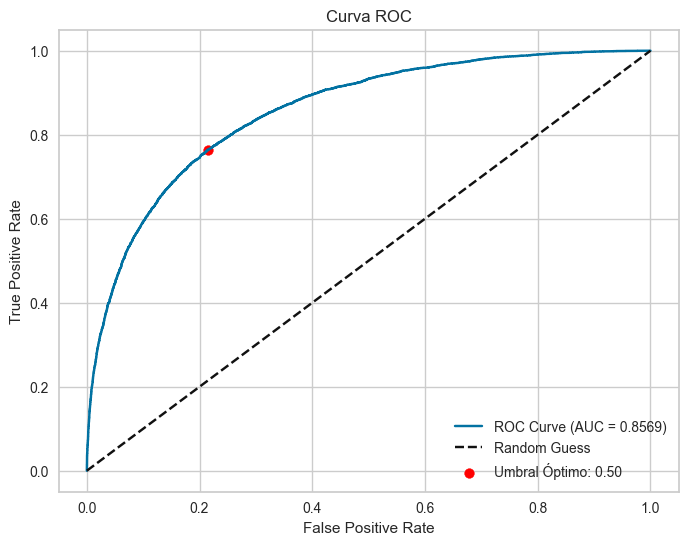

In [152]:
# Graficamos la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr_grid, tpr_grid, label=f"ROC Curve (AUC = {roc_auc_grid:.4f})")
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
plt.scatter(fpr_grid[optimal_idx_grid], tpr_grid[optimal_idx_grid], color='red', label=f"Umbral Óptimo: {optimal_threshold_grid:.2f}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC")
plt.legend()
plt.show()

## RANDOM SEARCH

In [153]:
def run_random_search(X_train, y_train, param_distributions, cv, n_iter=10):
    """
    Ejecuta Random Search con validación cruzada para encontrar los mejores hiperparámetros.
    """
    # Modelo base
    log_reg = LogisticRegression(max_iter=1000, random_state=42, class_weight='balanced')

    # Configuración de Random Search
    random_search = RandomizedSearchCV(
        estimator=log_reg,
        param_distributions=param_distributions,
        scoring='f1',  # Métrica a optimizar
        cv=cv,  # Validación cruzada
        n_iter=n_iter,  # Número de iteraciones
        verbose=1,
        random_state=42,
        n_jobs=-1  # Usar todos los núcleos disponibles
    )

    # Entrenamiento
    random_search.fit(X_train, y_train)

    return random_search

In [154]:
# Ejecutamos Random Search
random_search = run_random_search(X_train_scaled, y_train, parametros, kf, n_iter=10)

# Mejores hiperparámetros encontrados
print(f"Mejores hiperparámetros: {random_search.best_params_}")

# Mejor modelo encontrado
best_log_reg_random = random_search.best_estimator_

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Mejores hiperparámetros: {'solver': 'saga', 'penalty': 'l2', 'max_iter': 10000, 'C': 500}


In [155]:
# Evaluación del mejor modelo en el conjunto de prueba
y_pred_random = best_log_reg_random.predict(X_test_scaled)
y_pred_proba_random = best_log_reg_random.predict_proba(X_test_scaled)[:, 1]

# Métricas del mejor modelo
accuracy_random = accuracy_score(y_test, y_pred_random)
precision_random = precision_score(y_test, y_pred_random)
recall_random = recall_score(y_test, y_pred_random)
f1_random = f1_score(y_test, y_pred_random)
roc_auc_random = roc_auc_score(y_test, y_pred_proba_random)

print(f"Random Search - Accuracy: {accuracy_random:.4f}")
print(f"Random Search - Precision: {precision_random:.4f}")
print(f"Random Search - Recall: {recall_random:.4f}")
print(f"Random Search - F1-Score: {f1_random:.4f}")
print(f"Random Search - ROC-AUC: {roc_auc_random:.4f}")

Random Search - Accuracy: 0.7807
Random Search - Precision: 0.5055
Random Search - Recall: 0.7634
Random Search - F1-Score: 0.6082
Random Search - ROC-AUC: 0.8569


In [156]:
# Calculamos la curva ROC
fpr_random, tpr_random, thresholds_random = roc_curve(y_test, y_pred_proba_random)

# Encontramos el mejor umbral basado en la distancia mínima al punto ideal (0, 1)
optimal_idx_random = np.argmax(tpr_random - fpr_random)
optimal_threshold_random =thresholds_random[optimal_idx_random]

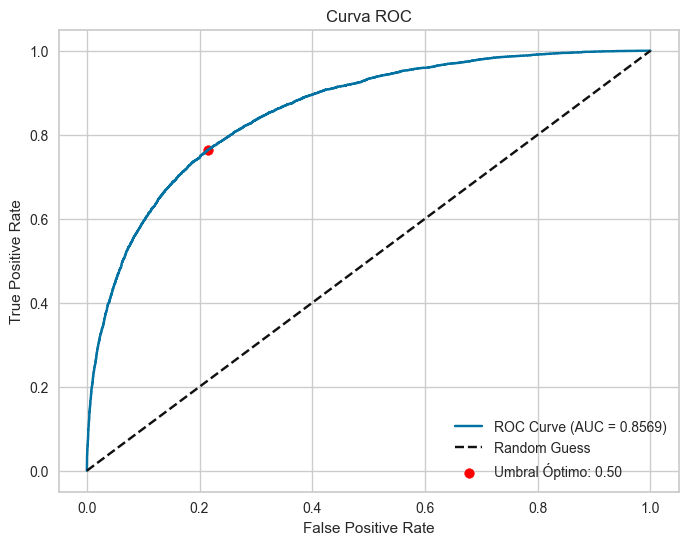

In [157]:
# Graficamos la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr_random, tpr_random, label=f"ROC Curve (AUC = {roc_auc_random:.4f})")
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
plt.scatter(fpr_random[optimal_idx_random], tpr_random[optimal_idx_random], color='red', label=f"Umbral Óptimo: {optimal_threshold_random:.2f}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC")
plt.legend()
plt.show()

## OPTUNA

In [158]:
def objective(trial):
    # Sugerir hiperparámetros
    params = {
        'C': trial.suggest_categorical('C', [0.01, 0.1, 1, 10, 100, 300, 500]),
        'solver': trial.suggest_categorical('solver', ['liblinear', 'saga', 'lbfgs', 'newton-cg', 'sag']),
        'penalty': trial.suggest_categorical('penalty', ['l1', 'l2', 'elasticnet']),
        'max_iter': trial.suggest_categorical('max_iter', [10, 50, 100, 500, 1000, 5000, 10000, 100000])
    }

    # Validar combinaciones inválidas
    if params['penalty'] == 'l1' and params['solver'] not in ['liblinear', 'saga']:
        raise optuna.TrialPruned()
    if params['penalty'] == 'elasticnet' and params['solver'] != 'saga':
        raise optuna.TrialPruned()

    # Agregar l1_ratio si es elasticnet
    if params['penalty'] == 'elasticnet':
        params['l1_ratio'] = trial.suggest_float('l1_ratio', 0.1, 0.9)

    model = LogisticRegression(random_state=42, class_weight='balanced', **params)
    scores = cross_val_score(model, X_train_scaled, y_train, cv=kf, scoring='f1', n_jobs=-1)
    return scores.mean()

In [159]:
def run_optuna(X_train, y_train, n_trials=50):
    """
    Ejecuta Optuna para encontrar los mejores hiperparámetros.
    """
    # Creamos un estudio de Optuna
    study = optuna.create_study(direction='maximize')  # Maximizamos el F1-score

    # Ejecutamos la optimización
    study.optimize(lambda trial: objective(trial), n_trials=n_trials)

    return study

In [160]:
# Ejecutamos Optuna
study = run_optuna(X_train_scaled, y_train, n_trials=50)

# Mejores hiperparámetros encontrados
print(f"Mejores hiperparámetros: {study.best_params}")

# Mejor valor de la métrica (F1-score)
print(f"Mejor F1-score: {study.best_value}")

[I 2025-06-20 23:27:13,899] A new study created in memory with name: no-name-b0b1488b-7805-4df9-93f1-e47d5813d6fb
[I 2025-06-20 23:27:13,912] Trial 0 pruned. 
[I 2025-06-20 23:27:13,913] Trial 1 pruned. 
[I 2025-06-20 23:27:13,914] Trial 2 pruned. 
[I 2025-06-20 23:27:13,914] Trial 3 pruned. 
[I 2025-06-20 23:27:13,915] Trial 4 pruned. 
[I 2025-06-20 23:27:13,915] Trial 5 pruned. 
[I 2025-06-20 23:27:15,034] Trial 6 finished with value: 0.6154701115456909 and parameters: {'C': 0.01, 'solver': 'saga', 'penalty': 'l2', 'max_iter': 500}. Best is trial 6 with value: 0.6154701115456909.
[I 2025-06-20 23:27:16,305] Trial 7 finished with value: 0.6157236581130245 and parameters: {'C': 1, 'solver': 'liblinear', 'penalty': 'l2', 'max_iter': 5000}. Best is trial 7 with value: 0.6157236581130245.
[I 2025-06-20 23:27:17,933] Trial 8 finished with value: 0.6155900193337345 and parameters: {'C': 0.1, 'solver': 'saga', 'penalty': 'elasticnet', 'max_iter': 50, 'l1_ratio': 0.28415938088605674}. Best is

Mejores hiperparámetros: {'C': 1, 'solver': 'liblinear', 'penalty': 'l2', 'max_iter': 5000}
Mejor F1-score: 0.6157236581130245


In [161]:
# Entrenamos el modelo con los mejores hiperparámetros
best_model_optuna = LogisticRegression(
    random_state=42,
    class_weight='balanced',  # Agregar esto también
    **study.best_params
)
best_model_optuna.fit(X_train_scaled, y_train)

# Evaluamos el modelo en el conjunto de prueba
y_pred_optuna = best_model_optuna.predict(X_test_scaled)
y_pred_proba_optuna = best_model_optuna.predict_proba(X_test_scaled)[:, 1]

# Métricas del modelo
accuracy_optuna = accuracy_score(y_test, y_pred_optuna)
precision_optuna = precision_score(y_test, y_pred_optuna)
recall_optuna = recall_score(y_test, y_pred_optuna)
f1_optuna = f1_score(y_test, y_pred_optuna)
roc_auc_optuna = roc_auc_score(y_test, y_pred_proba_optuna)

print(f"Optuna - Accuracy: {accuracy_optuna:.4f}")
print(f"Optuna - Precision: {precision_optuna:.4f}")
print(f"Optuna - Recall: {recall_optuna:.4f}")
print(f"Optuna - F1-Score: {f1_optuna:.4f}")
print(f"Optuna - ROC-AUC: {roc_auc_optuna:.4f}")

Optuna - Accuracy: 0.7807
Optuna - Precision: 0.5054
Optuna - Recall: 0.7634
Optuna - F1-Score: 0.6082
Optuna - ROC-AUC: 0.8569


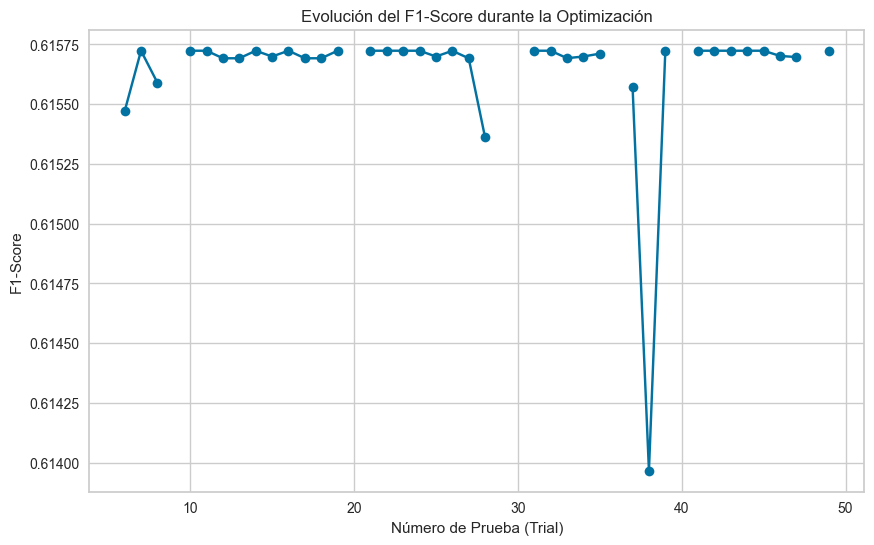

In [162]:
# Extraer los valores de las pruebas (trials) y sus F1-scores
trial_numbers = [trial.number for trial in study.trials]
f1_scores = [trial.value for trial in study.trials]

# Graficar la evolución del F1-score
plt.figure(figsize=(10, 6))
plt.plot(trial_numbers, f1_scores, marker='o', linestyle='-', color='b')
plt.xlabel("Número de Prueba (Trial)")
plt.ylabel("F1-Score")
plt.title("Evolución del F1-Score durante la Optimización")
plt.grid(True)
plt.show()

In [163]:
# Calculamos la curva ROC
fpr_optuna, tpr_optuna, thresholds_optuna = roc_curve(y_test, y_pred_proba_optuna)

# Encontramos el mejor umbral basado en la distancia mínima al punto ideal (0, 1)
optimal_idx_optuna = np.argmax(tpr_optuna - fpr_optuna)
optimal_threshold_optuna =thresholds_optuna[optimal_idx_optuna]

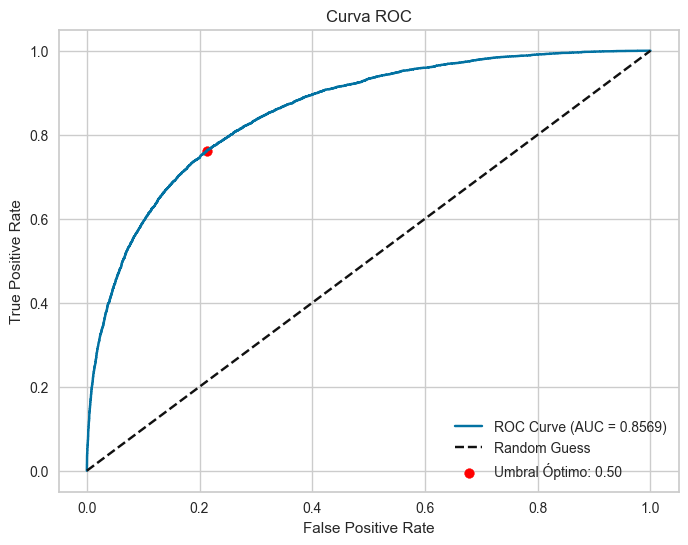

In [164]:
# Graficamos la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr_optuna, tpr_optuna, label=f"ROC Curve (AUC = {roc_auc_optuna:.4f})")
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
plt.scatter(fpr_optuna[optimal_idx_optuna], tpr_optuna[optimal_idx_optuna], color='red', label=f"Umbral Óptimo: {optimal_threshold_optuna:.2f}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC")
plt.legend()
plt.show()

Realizamos una optimizacion grande de varios hiperparametros lo que con GRID SEARCH tarda bastante por la alta cantidad de combinaciones, RANDOM SEARCH ya es mucho mas rapido y OPTUNA tardo un poco mas que RANDOM SEARCH pero muchisimo menos que GRID SEARCH

# Ejercicio 6

Vamos a usar para la explicabilidad al modelo balanceado ya que no tenemos duplicacion de valores como es el modelo con oversample y es mejor que el modelo sin balanceo.

In [165]:
nom_columns = X_train_scaled.columns

# Creamos el Explainer para el mejor modelo encontrado
explainer = shap.Explainer(log_reg_balanceado, X_train_scaled)

# Calculamos los valores SHAP para el conjunto de prueba
shap_values = explainer(X_test_scaled)

## Interpretabilidad local

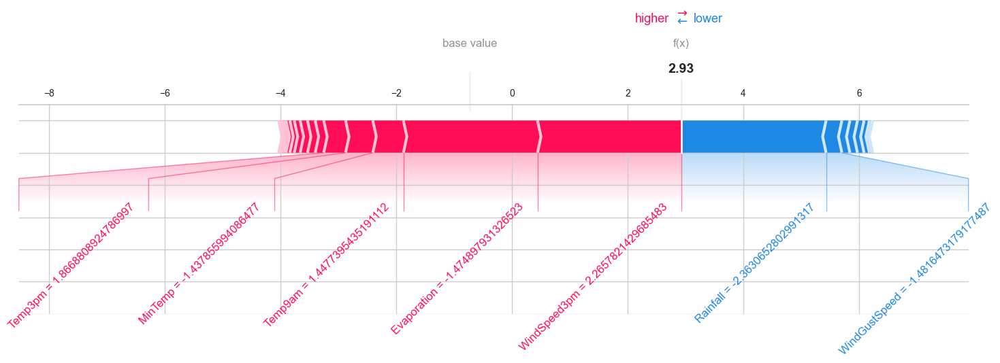

In [166]:
# Gráfico local: Force Plot
index = 0
shap.plots.force(shap_values[index], matplotlib=True, figsize=(18,4), text_rotation=45)


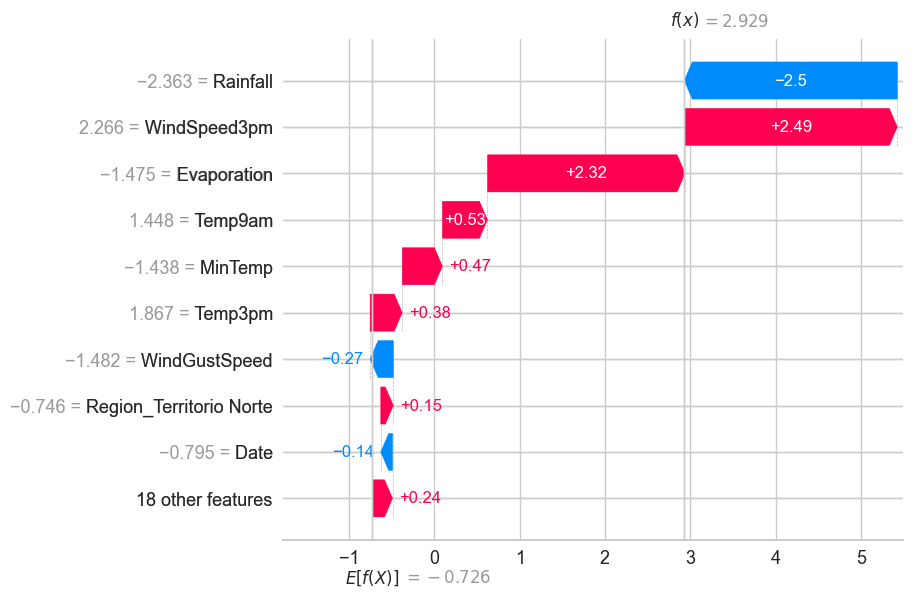

In [167]:
# Generar el waterfall plot
index = 0
shap.plots.waterfall(shap_values[index])

Aca tenemos un registro que tiene probabilidad de que si llovio.
Podemos ver que la variable que aportaron mas fueron WindSpeed3pm con un aporte de 2.49 y Evaporation con 2.31 ambas positivas y despues tenemos Rainfall con 2.48 pero negativamente.

Tenemos un valor base negativo asi que ya de por si tiende a estar a dias que no llovio de que si, Muy seguramente por la cantidad de dias que no lluven.

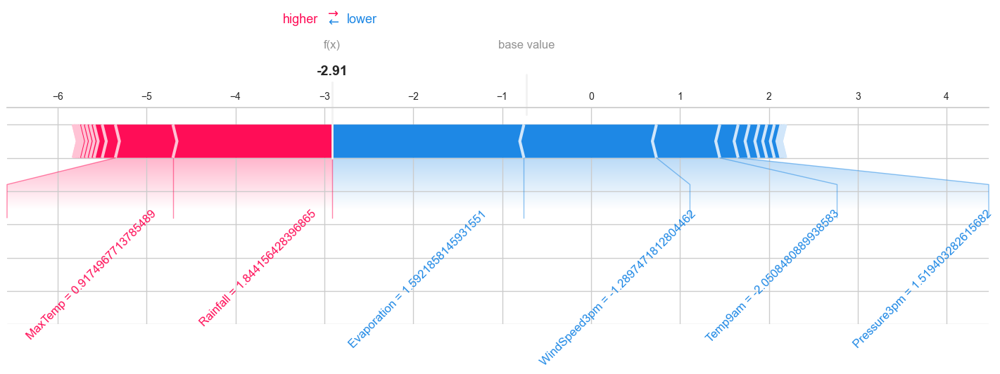

In [168]:
# Gráfico local: Force Plot
index = 2
shap.plots.force(shap_values[index], matplotlib=True, figsize=(18,4), text_rotation=45)


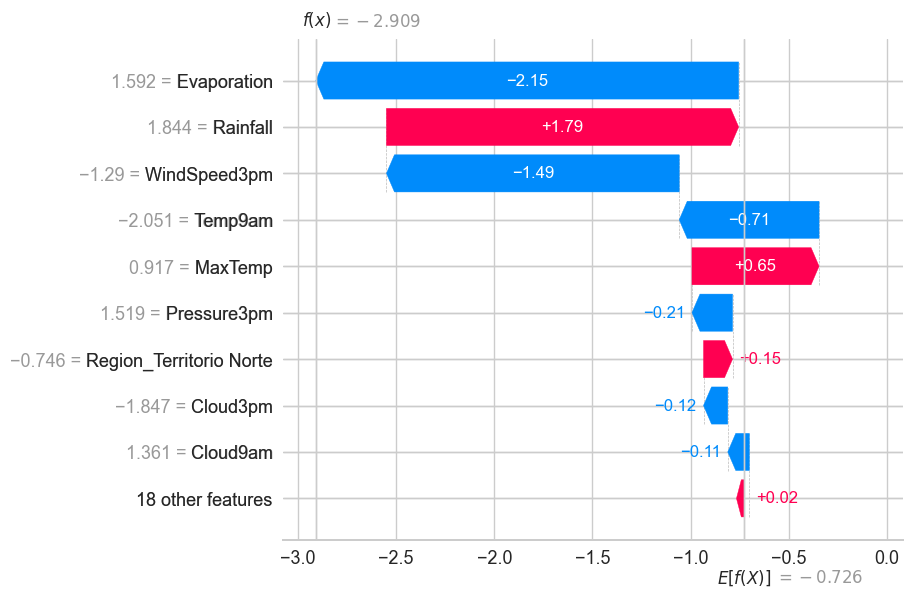

In [169]:
# Generar el waterfall plot
index = 2
shap.plots.waterfall(shap_values[index])

Aca podemos ver que es un dia en el que no llovio, que termino con un valor de -2.93. Podemos ver que las variables que mas le aportaron negatibamente fueron Evaporation con -2.14 , WindSpeed3pm con un valor de -1.49 y tambien Temp9am con un valor de -0.73. Tambien tuvimos variables que aportaron positivamente las cuales fueron Rainfall con 1.78 y MaxTemp con 0.65.

## Interpretabilidad global

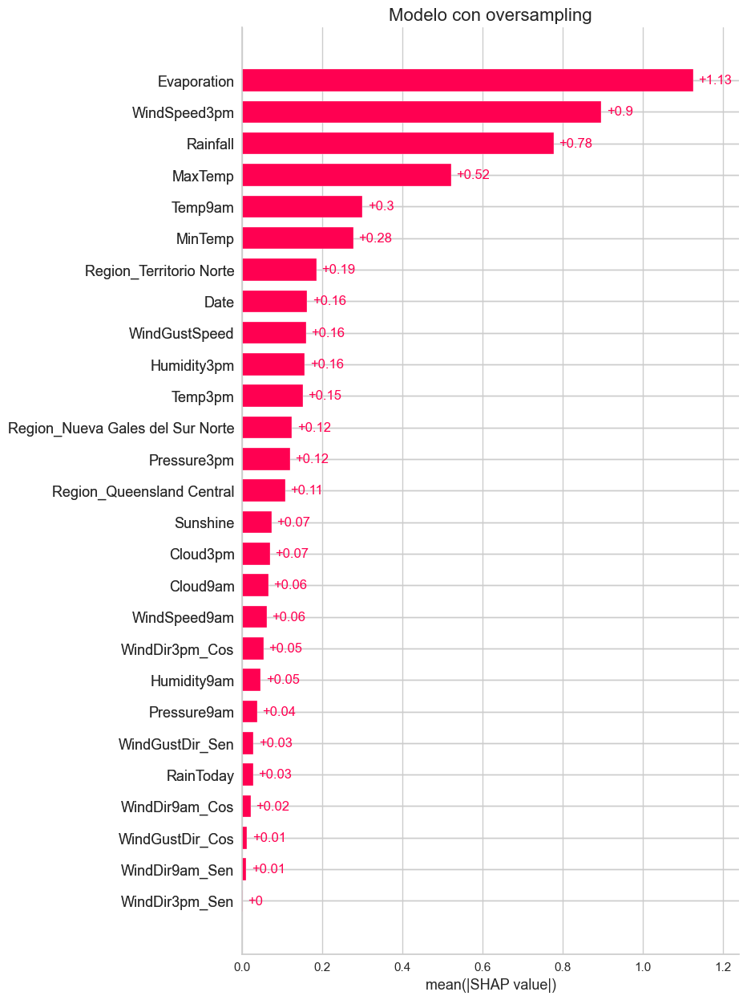

In [170]:
# Crear objeto Explanation
explanation = shap.Explanation(
    values=shap_values.values,  # importante usar .values si shap_values ya es un objeto Explanation
    base_values=shap_values.base_values,
    data=X_test_scaled,
    feature_names=nom_columns
)

# Gráfico de barras
plt.title("Modelo con oversampling", fontsize=16)
shap.plots.bar(explanation, max_display=35)

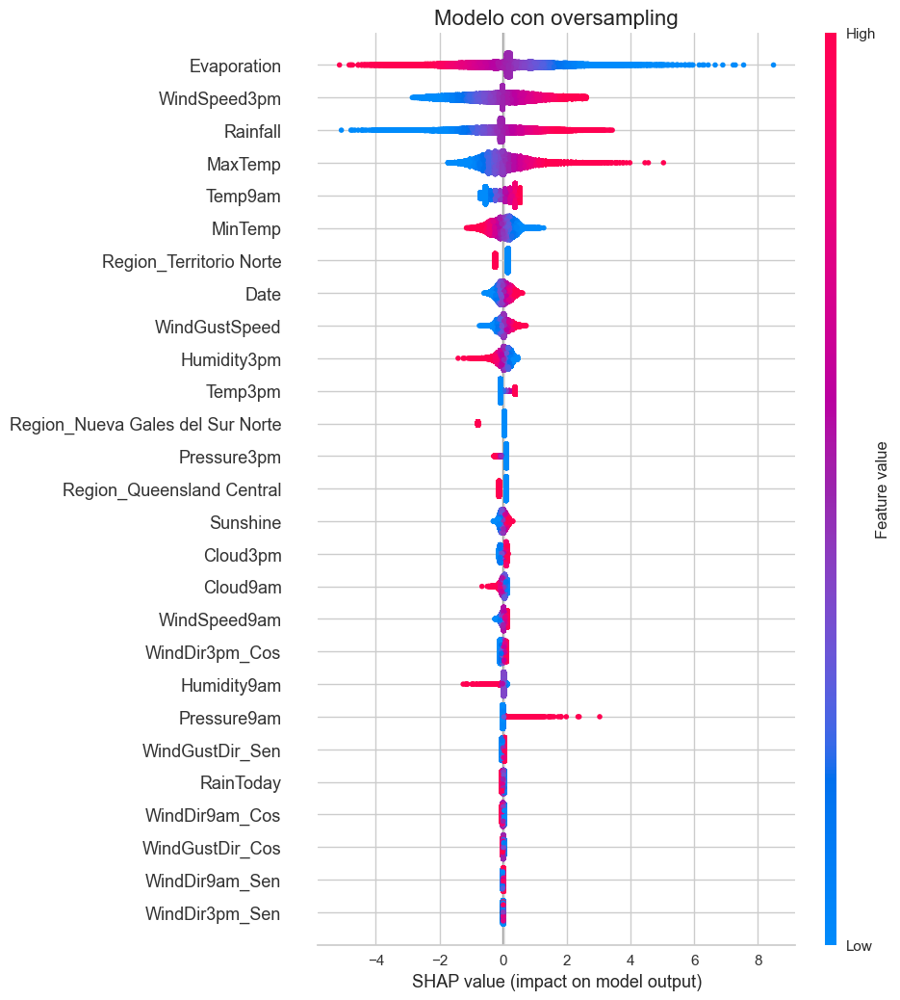

In [171]:
plt.figure(figsize=(12, 8))
plt.title("Modelo con oversampling", fontsize=16)
shap.plots.beeswarm(shap_values, max_display=35)

Podemos ver que las variables que mas aportan son Evaporation, WindSpeed3pm, Rainfall y MaxTemp las demas aportan mas o menos lo mismo porque son estas las q mas aportab con mas de 0.50 y maximo de 1.12.

Tenemos algunas variables que no aportan en nada como WindDir3pm_sen y otros que no aportan casi nada RainToday y las dirreciones delos vientos que codificamos con seno y coseno.Pueden ser mus probable que no aportan en lo apsoluto en la predicicon de si llueve o no y hasta se puede eliminar para hacer un modelo mas simple.

Podemos ver como Evaporation, WindSpeed3pm, Rainfall y MaxTemp tinene una dispersion en los valores shap, llendo desde un poco mas de -4 hasta un poco mas de 8.
Tambien podemos ver que a valores mas bajo de Evaporation tiende a tener valores de shap mas alto lo que hace que prediga que siva a llover. Ademas vemos que la mayorias de los valores estan cerca de 0, no vemos desplazamientos grandes de la mayor cantidad de las variables.

# Ejercicio 7

In [172]:
X = weather_depurado.drop('RainTomorrow', axis=1)
y = weather_depurado['RainTomorrow']
# Dividimos nuestro conjunto de datos en dos partes, la parte de entrenamiento y la parte de prueba.
# La division que hacemos de los datos son de 80/20, donde el 80 es para entrenamiento y el 20 restante para hacer un testeo.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Para hacer Regrecion Logistica
X_train = pd.DataFrame(X_train)
X_test = pd.DataFrame(X_test)

train_data = pd.concat([X_train, y_train], axis=1)

clf = setup(data=train_data, target='RainTomorrow', session_id=42, test_data=pd.concat([X_test, y_test], axis=1))

best_model = compare_models()

,Description,Value
0,Session id,42
1,Target,RainTomorrow
2,Target type,Binary
3,Original data shape,"(142193, 28)"
4,Transformed data shape,"(142193, 28)"
5,Transformed train set shape,"(113754, 28)"
6,Transformed test set shape,"(28439, 28)"
7,Numeric features,27
8,Rows with missing values,60.3%
9,Preprocess,True


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.8568,0.8898,0.5397,0.7527,0.6286,0.5429,0.5545,0.9760
et,Extra Trees Classifier,0.8564,0.8883,0.5052,0.7773,0.6123,0.5291,0.5476,3.6870
rf,Random Forest Classifier,0.8552,0.8857,0.5112,0.7661,0.6132,0.5285,0.5449,4.6150
gbc,Gradient Boosting Classifier,0.8499,0.8753,0.5059,0.7437,0.6022,0.5138,0.5283,5.8100
lda,Linear Discriminant Analysis,0.8429,0.8642,0.5117,0.7074,0.5938,0.4995,0.5096,0.1600
ada,Ada Boost Classifier,0.8426,0.8638,0.4931,0.7173,0.5844,0.4914,0.5045,1.2470
ridge,Ridge Classifier,0.8425,0.8644,0.4445,0.7525,0.5588,0.4705,0.4947,0.0760
lr,Logistic Regression,0.8415,0.8605,0.4853,0.7174,0.5789,0.4857,0.4998,2.0030
knn,K Neighbors Classifier,0.8335,0.8142,0.5045,0.6721,0.5763,0.4753,0.4829,2.4790
qda,Quadratic Discriminant Analysis,0.8280,0.8452,0.5527,0.6341,0.5905,0.4823,0.4841,0.1890


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 22982, number of negative: 79396
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2674
[LightGBM] [Info] Number of data points in the train set: 102378, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.224482 -> initscore=-1.239737
[LightGBM] [Info] Start training from score -1.239737
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 22982, number of negative: 79396
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006524 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_

Podemos apreciar que el modelo que mejor se adapta a nuesto dataset es el xgboost, ya que es el que posee mayor F1-score de 0.6381 que tomamos como mejor metrica para comparar los modelos. Tiene casi todas las mejores metricas este modelo.

# Ejercicio 8

In [173]:
# Crear el modelo Red Neuronal
MODELO_RN = Sequential()
MODELO_RN.add(Dense(48, activation='relu', input_shape=(X_train_scaled.shape[1],)))  # Capa de entrada
MODELO_RN.add(Dense(10, activation='relu'))  # Capa oculta
MODELO_RN.add(Dense(1, activation='sigmoid'))  # Capa de salida para clasificación binaria

# Compilar el modelo
MODELO_RN.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo
history = MODELO_RN.fit(X_train_scaled, y_train, epochs=20, batch_size=32, validation_split=0.2)

Epoch 1/20
2844/2844 [==============================] - 3s 857us/step - loss: 0.3669 - accuracy: 0.8407 - val_loss: 0.3536 - val_accuracy: 0.8452
Epoch 2/20
2844/2844 [==============================] - 2s 612us/step - loss: 0.3464 - accuracy: 0.8503 - val_loss: 0.3480 - val_accuracy: 0.8488
Epoch 3/20
2844/2844 [==============================] - 2s 853us/step - loss: 0.3409 - accuracy: 0.8514 - val_loss: 0.3422 - val_accuracy: 0.8523
Epoch 4/20
2844/2844 [==============================] - 3s 910us/step - loss: 0.3373 - accuracy: 0.8543 - val_loss: 0.3408 - val_accuracy: 0.8532
Epoch 5/20
2844/2844 [==============================] - 3s 1ms/step - loss: 0.3346 - accuracy: 0.8544 - val_loss: 0.3408 - val_accuracy: 0.8528
Epoch 6/20
2844/2844 [==============================] - 9s 3ms/step - loss: 0.3331 - accuracy: 0.8552 - val_loss: 0.3387 - val_accuracy: 0.8529
Epoch 7/20
2844/2844 [==============================] - 3s 1ms/step - loss: 0.3316 - accuracy: 0.8561 - val_loss: 0.3403 - val_a

In [174]:
# Evaluacion del modelo
loss, accuracy = MODELO_RN.evaluate(X_test_scaled, y_test)
print(f'Accuracy: {accuracy:.4f}')

y_pred = MODELO_RN.predict(X_test_scaled)
y_pred = np.array(y_pred)
y_pred = np.round(y_pred)
f1 = f1_score(y_test, y_pred)
print("El valor del f1 es: ",f1)

889/889 [==============================] - 0s 309us/step - loss: 0.3412 - accuracy: 0.8544
Accuracy: 0.8544
889/889 [==============================] - 0s 252us/step
El valor del f1 es:  0.6146831673955523


In [186]:
# Optimización bayesiana con fallback
def create_model(optimizer='Adam', epochs=50, batch_size=32, neurons_1=32, neurons_2=16):
    model = Sequential()
    model.add(Dense(neurons_1, activation='relu', input_shape=(X_train_scaled.shape[1],)))
    model.add(Dense(neurons_2, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

def objective(params):
    optimizer, epochs, batch_size, neurons_1, neurons_2 = params
    print(f"OPT: {optimizer} EPC: {epochs} BTC: {batch_size} NEU1: {neurons_1} NEU2: {neurons_2}")

    model = create_model(optimizer, epochs, batch_size, neurons_1, neurons_2)
    history = model.fit(X_train_scaled, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0)

    y_pred = model.predict(X_test_scaled)
    y_pred = np.round(y_pred)
    f1 = f1_score(y_test, y_pred)
    print(f"F1: {f1}")
    return -f1

try:
    space = [
        Categorical(['Adam', 'SGD']),
        Integer(20, 50),
        Integer(16, 32),
        Integer(10, 50),
        Integer(10, 50)
    ]

    result = gp_minimize(objective, space, n_calls=20, random_state=42)
    print("✅ Optimización bayesiana exitosa!")

except Exception as e:
    print(f"❌ Error bayesiana: {e}")
    print("🔄 Usando búsqueda aleatoria como alternativa...")

    # Búsqueda aleatoria (mejor que grid search)
    import random
    random.seed(42)

    best_f1 = float('inf')
    best_params = None

    for i in range(20):
        params = [
            random.choice(['Adam', 'SGD']),
            random.randint(20, 50),
            random.randint(16, 32),
            random.randint(10, 50),
            random.randint(10, 50)
        ]
        f1_neg = objective(params)
        if f1_neg < best_f1:
            best_f1 = f1_neg
            best_params = params

    class Result:
        def __init__(self):
            self.x = list(best_params)
            self.fun = best_f1

    result = Result()

print(f"Mejores parámetros: {result.x}")
print(f"Mejor F1-Score: {-result.fun}")

❌ Error bayesiana: module 'numpy' has no attribute 'int'.
`np.int` was a deprecated alias for the builtin `int`. To avoid this error in existing code, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
The aliases was originally deprecated in NumPy 1.20; for more details and guidance see the original release note at:
    https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
🔄 Usando búsqueda aleatoria como alternativa...
OPT: Adam EPC: 20 BTC: 24 NEU1: 25 NEU2: 24
889/889 [==============================] - 0s 376us/step
F1: 0.6252465483234714
OPT: Adam EPC: 38 BTC: 29 NEU1: 12 NEU2: 11


KeyboardInterrupt: 

In [ ]:
# Los mejores parámetros
print("Mejores parámetros:", result.x)

optimizer, epochs, batch_size, neurons_1, neurons_2 = result.x

modelo_rn_best = create_model(optimizer,epochs,batch_size,neurons_1,neurons_2)
history = modelo_rn_best.fit(X_train_scaled, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0)
MODELO_RN_OPTIMIZADO = modelo_rn_best

In [ ]:
X_reduced = X_test_scaled[:1000]

explainer = shap.Explainer(MODELO_RN, X_reduced)
explanation = explainer(X_reduced[:1000])

shap_values = explainer(X_reduced)

In [ ]:
# Visualización de los valores SHAP para el modelo de Red Neuronal
shap.plots.bar(shap_values, max_display=35)

In [ ]:
shap.plots.beeswarm(shap_values, max_display=30)
plt.show()

In [ ]:
# Visualización de un gráfico de cascada para un ejemplo específico
shap.plots.waterfall(shap_values[0], max_display=30)
plt.show()

In [ ]:
# Visualización de un gráfico de cascada para un ejemplo específico
shap.plots.waterfall(shap_values[2], max_display=30)
plt.show()

In [ ]:
# Gráfico local: Force Plot
index = 0  # Cambia este índice según la observación que quieras analizar
shap.plots.force(shap_values[index], matplotlib=True, figsize=(18,4), text_rotation=45)


In [ ]:
# Gráfico local: Force Plot
index = 2  # Cambia este índice según la observación que quieras analizar
shap.plots.force(shap_values[index], matplotlib=True, figsize=(18,4), text_rotation=45)

# Ejercicio 9

In [ ]:
def Metricas(modelo, X_test_scaled=X_test_scaled, y_test=y_test):
    y_pred = modelo.predict(X_test_scaled)

    # Métricas del modelo
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred)

    print(f"Modelo {modelo} - Accuracy: {accuracy:.4f}")
    print(f"Modelo {modelo} - Precision: {precision:.4f}")
    print(f"Modelo {modelo} - Recall: {recall:.4f}")
    print(f"Modelo {modelo} - F1-Score: {f1:.4f}")
    print(f"Modelo {modelo} - ROC-AUC: {roc_auc:.4f}")


    print("#######")
    print("f1-score ",round(f1,4))
    print("#######")

    # Matriz de confusión del modelo
    ConfusionMatrixDisplay.from_estimator(modelo, X_test_scaled, y_test, cmap='Blues')
    plt.title("Matriz de Confusión - Modelo Base")
    plt.show()

In [ ]:
def Metricas_RN(modelo, X_test_scaled=X_test_scaled, y_test=y_test):
    y_pred = modelo.predict(X_test_scaled)

    # Convertir las probabilidades en clases binarias (0 o 1)
    y_pred = np.where(y_pred < 0.5, 0, 1)

    # Métricas del modelo
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred)

    print(f"Modelo {modelo} - Accuracy: {accuracy:.4f}")
    print(f"Modelo {modelo} - Precision: {precision:.4f}")
    print(f"Modelo {modelo} - Recall: {recall:.4f}")
    print(f"Modelo {modelo} - F1-Score: {f1:.4f}")
    print(f"Modelo {modelo} - ROC-AUC: {roc_auc:.4f}")

    print("#######")
    print("f1-score ",round(f1,4))
    print("#######")

    # Matriz de confusión del modelo
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='Blues')  # Usa from_predictions en lugar de from_estimator
    plt.title("Matriz de Confusión - Modelo Base")
    plt.show()



**Conclusion:**

Analizando el F1-SCORE por ser una gran metrica para dataset desbalanceados, vemos que el MODELO DE RED NEURONAL OPTIMIZADO ES EL MEJOR.

In [ ]:
Metricas(dummy_clf,)
Metricas(log_reg)
Metricas(log_reg_balanced)
Metricas(log_reg_smote)
Metricas_RN(MODELO_RN)
Metricas_RN(MODELO_RN_OPTIMIZADO)
